# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

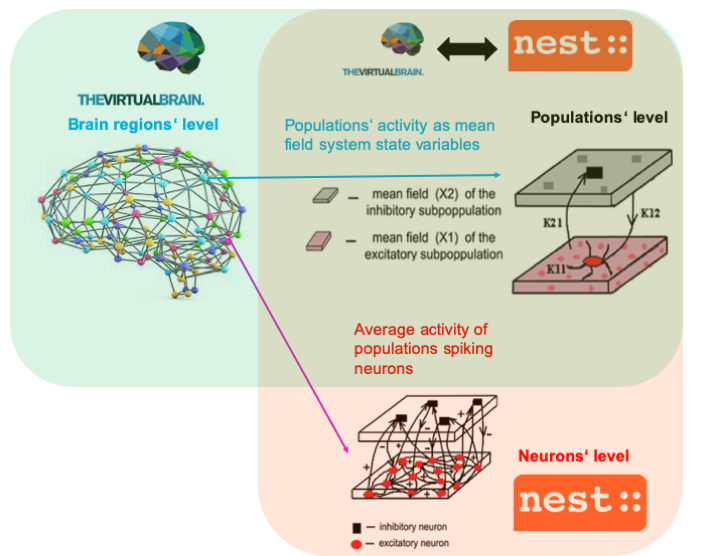

In [1]:
from IPython.core.display import Image, display
display(Image(filename='./ConceptGraph.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

### TVB - NEST co-simulation with Reduced Wong-Wang model

We demonstrate a multiscale simulation <br> of a reduced Wong-Wang model [3] <br> using TVB [1, 2] for brain region modelled at coarse scale, <br> and NEST [4] for regions modelled as <br> networks of spiking neural populations.

## Reduced Wong-Wang mean field model


Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_i}^{(E)} = - \frac{1}{\tau_E}{S_i}^{(E)} + (1-{S_i}^{(E)})\gamma_{E} {r_i}^{(E)}$

$\dot{S_i}^{(I)} = - \frac{1}{\tau_I}{S_i}^{(I)} + \gamma_I{r_i}^{(I)}$

where we bound ${S_i}^{(E/I)} \in $ [0.0, 1.0], 

and $ {r_i}^{(E/I)} $ is the firing rate given by:

$ {r_i}^{(E/I)} = H({I_{syn_i}}^{(E/I)}, a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_i}}^{(E/I)},  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_i}}^{(E/I)}-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_i}}^{(E/I)}-b_{(E/I)})}}$ 

is a sigmoidal input->output function of the input synaptic current.

The total input synaptic current to excitatory populations is given by: 

$ {I_{syn_i}}^{(E)} = W_EI_o + w_+J_{NMDA}{S_i}^{(E)} - J_{i}{S_i}^{(I)} + GJ_{NMDA}\sum_{j\neq i}C_{ij}S_{j}^{(E)}(t-\tau_{ij})$

and to inhibitory ones:

$ {I_{syn_i}}^{(I)} = W_II_o + J_{NMDA}{S_i}^{(E)} - {S_i}^{(I)} +  \lambda GJ_{NMDA}\sum_{j\neq i}C_{ij}S_{j}^{(E)}(t-\tau_{ij})$

where 
$\lambda  \in${0, 1} for (not) allowing feedforward inhibition, respectively.

TVB connectivity weights $C_{ij}$ are scaled per "region"

## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{ij}$
- structural TVB connectivity delays $\tau_{ij}$
- global structural brain connectivity coupling constant $G$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda = 1$, allowing for feedforward inhibition


## Spiking network model in NEST

For every neuron $i$ in region node $n$:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L - {I_{ni}}^{AMPA} - {I_{ni}}^{NMDA} - {I_{ni} ^{GABA}}- \sum_{n\prime \neq n}{I_{n\prime \neq ni}}^{AMPA,ext} +{I_{ni}}^{ext} $

$\;\;\;\;\;\;\;\;\;\;=-g_m({V_{ni}}^m - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA}({V_{ni}}^m - V_E)w_E{S_{ni}}^{AMPA} $

$\;\;\;\;\;\;\;\;\;\;\;-\frac{g_{NMDA}({V_{ni}}^m - V_E)}{1+\lambda_{NMDA}e^{-\beta{V_{ni}}^m}}w_E{S_{ni}}^{NMDA} $

$\;\;\;\;\;\;\;\;\;\;\;-g_{GABA}({V_{ni}}^m - V_I)w_I{S_{ni}}^{GABA} $

$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA,ext}({V_{ni}}^m - V_E)G\sum_{n\prime \neq n}C_{n\prime \neq n}{S_{n\prime \neq ni}}^{AMPA,ext} $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext} $

$ {\dot{S}_{ni}}^{AMPA/GABA} = -\frac{1}{\tau_{AMPA/GABA,decay}}{S_{ni}}^{AMPA/GABA} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j \in n}$

$ {\dot{X}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,rise}}{X_{ni}}^{NMDA} + \left[ \sum_{j=1,j \neq i}^{N_E} \sum_k \delta(t-{t_j}^k) \right]_{j \in n} $

$ {\dot{S}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,decay}}{S_{ni}}^{NMDA} + \alpha {X_{ni}}^{NMDA} (1 - \frac{1}{N_E-1}{S_{ni}}^{NMDA}) $

$ {\dot{S}_{n\prime \neq ni}}^{AMPA,ext} = -\frac{1}{\tau_{AMPA,decay}}{S_{n\prime \neq ni}}^{AMPA,ext} + \left[ \sum_{j=1}^{N_E} \sum_k \delta(t-{t_j}^k) \right]_{j \in n\prime, n\prime \neq n} $

Boundaries assuming that self-connections of neurons are not possible:

For excitatory neurons:

$ {S_{exc}}^{AMPA/NMDA} \in [0.0, N_E-1]$

$ {S_{exc}}^{GABA} \in [0.0, N_I]$

For inhibitory neurons:

$ {S_{inh}}^{AMPA/NMDA} \in [0.0, N_E]$

$ {S_{inh}}^{GABA} \in [0.0, N_I-1]$

For all neurons:

$ {S_{exc/inh}}^{AMPA,ext} \in [0.0, N_E]$

When $V_m > V_{th}$, emit a spike and clamp $V_m$ to $V_{reset}$ for $\tau_{ref}$ ms.


## Interfacing (coupling) TVB $\rightarrow$ NEST

#### Coupling a TVB region node state variable to a NEST population of a brain region node.

We assume that at each NEST region node, we place an excitatory (E) and an inhibitory (I) population of spiking neurons


### A. Current

$ TVB \big\{ N_E * GJ_{NMDA}\sum_{n'\in TVB->n\in NEST}C_{nn'}S_{n}^{(E)}(t-\tau_{nn'}) \big\} \rightarrow NEST \big\{ {I_{ext_i}} ^ {(E/I,\; n\in NEST)} \big\} $

#### 1. Using NEST dc generator stimulating devices as TVB "proxy" nodes:

$interfaceWeight_{𝑛′∈𝑇𝑉𝐵} * TVB \big\{ N_E * J_{NMDA}S_{𝑛′∈𝑇𝑉𝐵}^{(E)}(t) \big\} $ 
    
$\;\;\;\;\;\; \rightarrow NEST \big\{ "TVB \; proxy \; nodes \; as \; NEST \; dc \; generators" \;: $

$ \;\;\;\;\;\;\;\;\; interfaceWeight_{𝑛′∈𝑇𝑉𝐵} * N_E * J_{NMDA}C_{nn'}S_{𝑛′∈𝑇𝑉𝐵}^{(E)}(t-\tau_{nn}') \big\}$
    
$\;\;\;\;\;\;\;\;\;\;\;\; \rightarrow NEST \big\{ {I_{ext_i}} ^ {(E/I,\; n\in NEST)} \big\} $


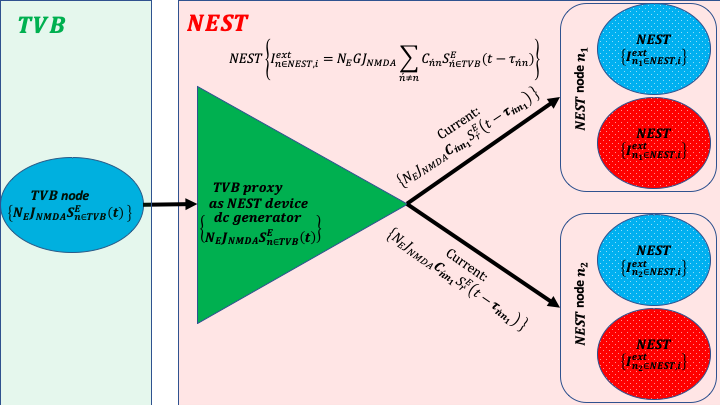

In [2]:
display(Image(filename='./DC.png',  width=1000, unconfined=False))

#### 2. Directly setting ${I_{ext_i}} ^ {(E/I,\; n\in NEST)}$ NEST parameter with TVB coupling input:

$interfaceWeight_{n\in NEST} \big\{ N_E * GJ_{NMDA}\sum_{n'\in TVB->n\in NEST}C_{nn'}S_{n}^{(E)}(t-\tau_{nn'}) \big\} \rightarrow NEST \big\{ {I_{ext_i}} ^ {(E/I,\; n\in NEST)} \big\} $

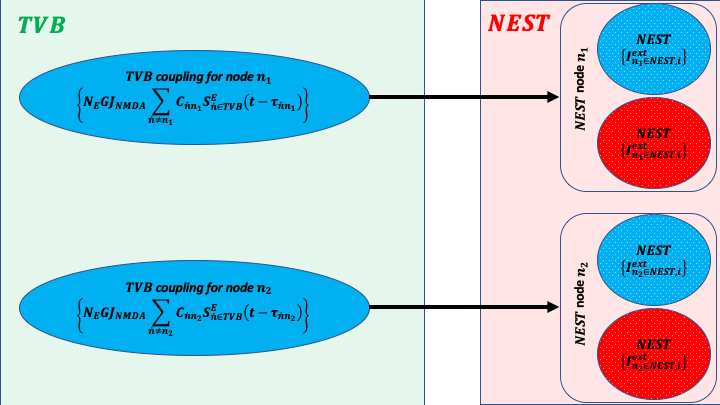

In [3]:
display(Image(filename='./Ie.png',  width=1000, unconfined=False))

### B.  Instantaneous mean  spike rate 
$interfaceWeight_{𝑛′∈𝑇𝑉𝐵}TVB \big\{ r_{𝑛′∈𝑇𝑉𝐵}^{(E)}(t) \big\} $ 
    
$\;\;\;\;\;\; \rightarrow NEST \big\{  "TVB \; proxy \; nodes \; as \; NEST \; poisson \; generators"\;: $

$\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;  
\sum_{i\in N_{(E/I)}}\sum_k\delta(t-({t_i}^k + \tau_{nn'})) \big \} $

$\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\; 
\rightarrow NEST \big \{ {I_{syn_i}} ^ {(E/I,\; n\in NEST)} \big\} $

where $\delta(t) = 1$ for $t=0$, and 0 otherwise

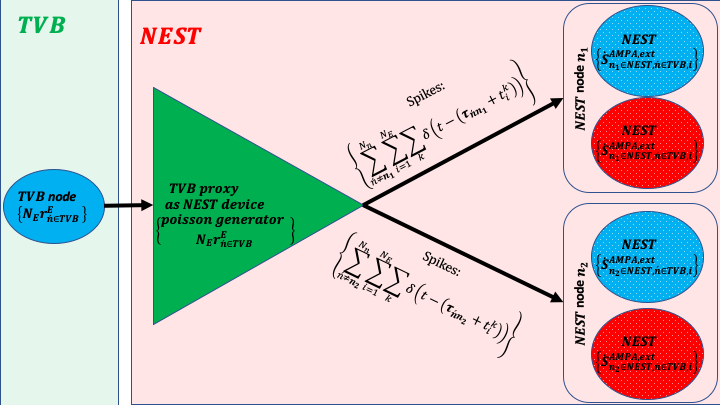

In [4]:
display(Image(filename='./Rate.png',  width=1000, unconfined=False))

## Interfacing (updating) TVB $\leftarrow$ NEST

### Instantaneous mean spike rate 

$TVB${$r_{n\in NEST}^{(E/I)}$}$ \leftarrow N_{n\in NEST}$ "spike detector devices" { $\frac{{{\sum_{i\in N_{(E/I)}}\sum_k\delta(t-{t_i}^k)}_{n\in NEST}}}{N_{E/I}} * \frac{1}{dt}$}

where $dt$ is the TVB integration time step

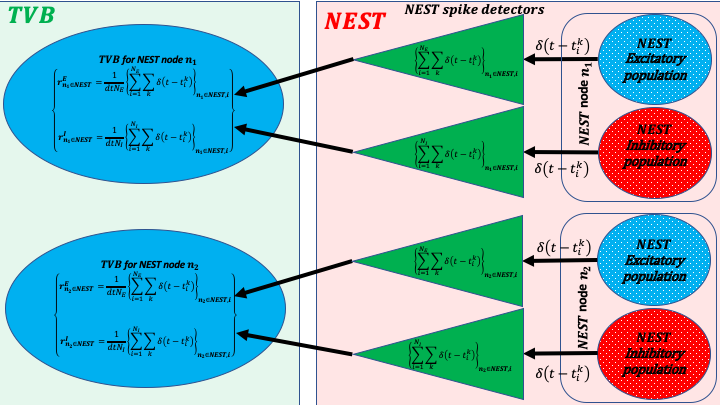

In [5]:
display(Image(filename='./NEST->TVB.png',  width=1000, unconfined=False))

## Simulator loop

### Simulating several (i.e., 10) NEST time steps for every 1 TVB time step for stable integration

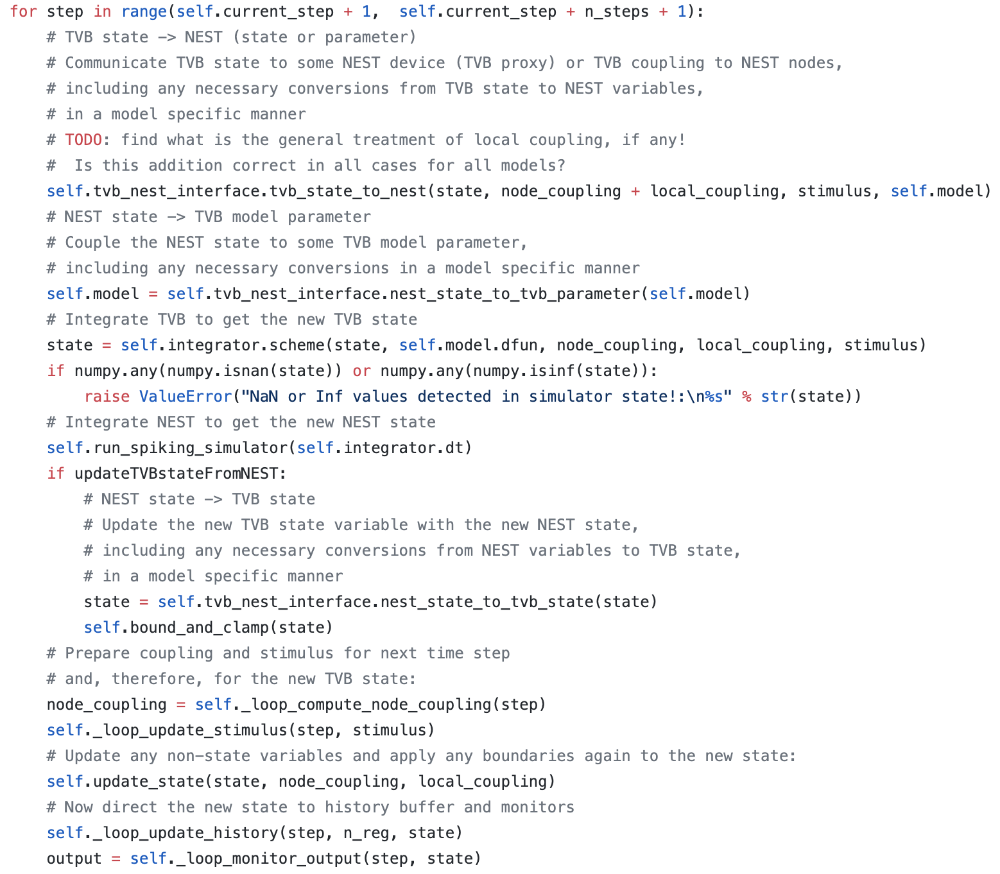

In [6]:
display(Image(filename='./simulator_loop.png',  width=600, unconfined=False))

In [7]:
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_nest.config import *
config = Config()
config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'

from tvb_multiscale.plot.plotter import Plotter
plotter = Plotter(config)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 

2020-01-13 16:50:03,902 - INFO - numexpr.utils - NumExpr defaulting to 6 threads.


/home/docker/packages/tvb-root/scientific_library/tvb/datatypes/surfaces.py:61: UserWarning: Geodesic distance module is unavailable; some functionality for surfaces will be unavailable.
  warnings.warn(msg)


2020-01-13 16:50:04,936 - DEBUG - matplotlib - $HOME=/home/docker
2020-01-13 16:50:04,937 - DEBUG - matplotlib - CONFIGDIR=/home/docker/.config/matplotlib
2020-01-13 16:50:04,942 - DEBUG - matplotlib - matplotlib data path: /usr/share/matplotlib/mpl-data
2020-01-13 16:50:04,943 - DEBUG - matplotlib - loaded rc file /etc/matplotlibrc
2020-01-13 16:50:04,946 - DEBUG - matplotlib - matplotlib version 3.0.2
2020-01-13 16:50:04,947 - DEBUG - matplotlib - interactive is False
2020-01-13 16:50:04,948 - DEBUG - matplotlib - platform is linux
2020-01-13 16:50:04,950 - DEBUG - matplotlib - loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', 'zipimport', '_frozen_importlib_external', '_io', 'marshal', 'posix', 'encodings', 'codecs', '_codecs', 'encodings.aliases', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', 'io', 'abc', '_abc', '_bootlocale', '_locale', 'site', 'os', 'stat', '_stat', 'posixpath', 'genericpath', 'os.path', '_colle

2020-01-13 16:50:04,998 - DEBUG - matplotlib - CACHEDIR=/home/docker/.cache/matplotlib
2020-01-13 16:50:05,000 - DEBUG - matplotlib.font_manager - font search path ['/usr/share/matplotlib/mpl-data/fonts/ttf', '/usr/share/matplotlib/mpl-data/fonts/afm', '/usr/share/matplotlib/mpl-data/fonts/pdfcorefonts']
2020-01-13 16:50:05,162 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/ttf/cmtt10.ttf
2020-01-13 16:50:05,164 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/ttf/STIXGeneralBol.ttf
2020-01-13 16:50:05,165 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/ttf/STIXNonUniIta.ttf
2020-01-13 16:50:05,166 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/ttf/STIXSizFourSymReg.ttf
2020-01-13 16:50:05,168 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/ttf/DejaVuSansMono-BoldOblique.ttf
2020-01-

2020-01-13 16:50:05,273 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/opentype/freefont/FreeSansBold.otf
2020-01-13 16:50:05,276 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/opentype/freefont/FreeMonoBold.otf
2020-01-13 16:50:05,279 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/truetype/lyx/msam10.ttf
2020-01-13 16:50:05,281 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/truetype/ttf-bitstream-vera/VeraMoBd.ttf
2020-01-13 16:50:05,283 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/opentype/freefont/FreeMono.otf
2020-01-13 16:50:05,284 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/truetype/lyx/cmr10.ttf
2020-01-13 16:50:05,286 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/truetype/lyx/cmex10.ttf
2020-01-13 16:50:05,287 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/fonts/truetype/ttf-bitstream-vera/VeraBI.ttf
2020

2020-01-13 16:50:05,603 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/afm/pncr8a.afm
2020-01-13 16:50:05,607 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/pdfcorefonts/Courier-Bold.afm
2020-01-13 16:50:05,612 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/afm/phvro8an.afm
2020-01-13 16:50:05,617 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/afm/putbi8a.afm
2020-01-13 16:50:05,623 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/afm/pncb8a.afm
2020-01-13 16:50:05,628 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/afm/ptmbi8a.afm
2020-01-13 16:50:05,633 - DEBUG - matplotlib.font_manager - createFontDict: /usr/share/matplotlib/mpl-data/fonts/afm/phvb8a.afm
2020-01-13 16:50:05,638 - DEBUG - matplotlib.font_manager - createFontDict: /usr/shar

## 1. Load structural data <br> (minimally a TVB connectivity)

2020-01-13 16:50:07,223 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f59cfeaa160>
2020-01-13 16:50:07,225 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-01-13 16:50:07,226 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f59cfeaa160>
2020-01-13 16:50:07,228 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-01-13 16:50:07,385 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:50:07,387 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2020-01-13 16:50:07,433 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0 to DejaVu Sans ('/usr/share/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000.
2020-01-13 16:50:07,776 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans

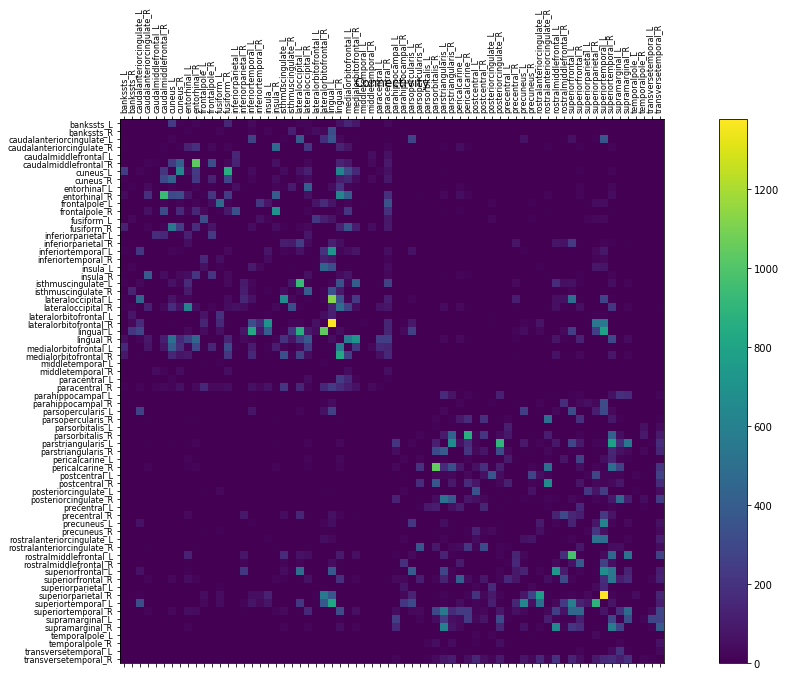

2020-01-13 16:50:09,818 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f59cfd2a128>
2020-01-13 16:50:09,819 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-01-13 16:50:09,820 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f59cfd2a128>
2020-01-13 16:50:09,821 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-01-13 16:50:10,049 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:50:10,051 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2020-01-13 16:50:10,439 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:50:10,570 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:50:10,572 - DEBUG - matplotlib.axes._base - title position was updated manually, not adjusting
2020-01-13 16:50:10,980 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:50:11,

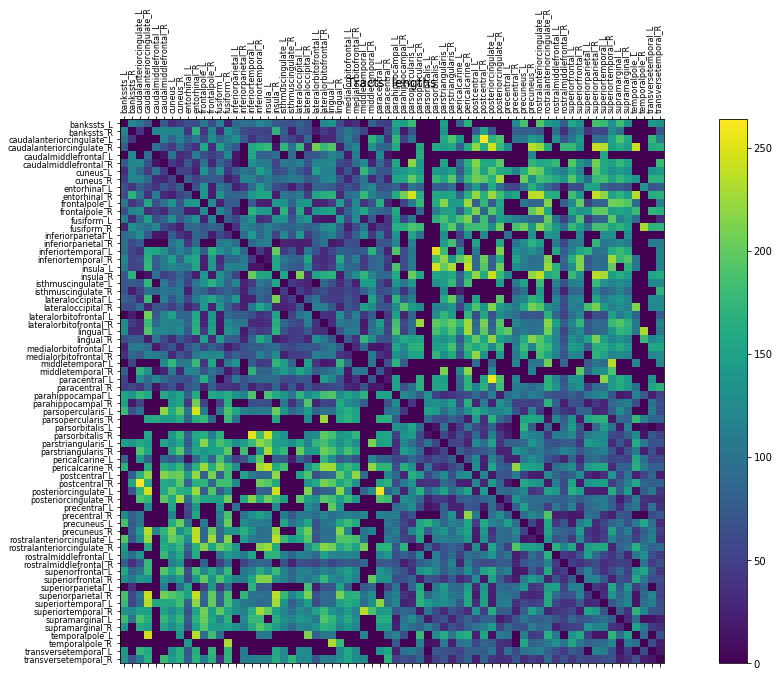

(<Figure size 1440x720 with 2 Axes>,
 <Figure size 1440x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f59cfd4a208>)

In [8]:
from tvb.datatypes.connectivity import Connectivity
connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
connectivity.configure()
plotter.plot_tvb_connectivity(connectivity)

## 2. Prepare TVB simulator <br> (region mean field model, integrator, monitors etc)

In [9]:
from tvb_multiscale.simulator_tvb.simulator import Simulator
from tvb_multiscale.simulator_tvb.models.reduced_wong_wang_exc_io_inh_i \
    import ReducedWongWangExcIOInhI
from tvb.simulator.monitors import Raw  # , Bold, EEG

# Create a TVB simulator and set all desired inputs
# (connectivity, model, surface, stimuli etc)
# We choose all defaults in this example
simulator = Simulator()
simulator.model = ReducedWongWangExcIOInhI()
simulator.model.J_i = np.array([0.1, ]) # Feedback inhibition

simulator.connectivity = connectivity
simulator.integrator.dt = 0.1
simulator.integrator.noise.nsig = np.array([0.001])

mon_raw = Raw(period=simulator.integrator.dt)
# Some extra monitors for neuroimaging measures:
# mon_bold = Bold(period=2000.)
# mon_eeg = EEG(period=simulator.integrator.dt)
simulator.monitors = (mon_raw, )  # mon_bold, mon_eeg

2020-01-13 16:50:12,814 - WARNING - tvb.simulator.common - psutil module not available: no warnings will be issued when a
    simulation may require more memory than available
2020-01-13 16:50:12,836 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.HyperbolicTangent.b = NArray(label=':math:`b`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2020-01-13 16:50:12,841 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.Kuramoto.a = NArray(label=':math:`a`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2020-01-13 16:50:13,495 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.models.oscillator.Generic2dOscillator.gamma = NArray(label=':math:`\\gamma`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
20

## 3. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike detectors etc)

In [10]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        
from tvb_nest.nest_models.builders.models.ww_deco2014 \
    import WWDeco2014Builder

# Build a NEST network model with the corresponding builder
# Using all default parameters for this example
nest_model_builder = WWDeco2014Builder(simulator, nest_nodes_ids, config=config)


# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_model_builder.population_order = 100

exc_pop_scale=1.0
inh_pop_scale=0.7
exc_pop_size = int(nest_model_builder.population_order * exc_pop_scale)
inh_pop_size = int(nest_model_builder.population_order * inh_pop_scale)

common_params = {
    "V_th": -50.0,  # mV    
    "V_reset": -55.0,  # mV  
    "E_L": -70.0,  # mV 
    "E_ex": 0.0,   # mV
    "E_in": -70.0,  # mV
    "tau_decay_AMPA": 2.0,    # ms
    "tau_decay_GABA_A": 10.0,  # ms
    "tau_decay_NMDA": 100.0,  # ms
    "tau_rise_NMDA": 2.0,  # ms
    "s_AMPA_ext_max": exc_pop_size*np.ones((nest_model_builder.number_of_nodes, )).astype("f")
    }
nest_model_builder.params_ex = dict(common_params)
nest_model_builder.params_ex.update({
    "C_m": 500.0,  # pF
    "g_L": 25.0,  # nS
    "t_ref": 2.0,  # ms
    "g_AMPA_ext": 3.37,  # nS
    "g_AMPA": 0.065,  # nS 
    "g_NMDA": 0.20,  # nS
    "g_GABA_A": 10.94,  # nS
    "w_E": nest_model_builder.tvb_model.w_p[0],  #w+ in the paper
    "w_I": nest_model_builder.tvb_model.J_i[0],
    "N_E": exc_pop_size-1,
    "N_I": inh_pop_size
    })
nest_model_builder.params_in = dict(common_params)
nest_model_builder.params_in.update({
    "C_m": 200.0,  # pF
    "g_L": 20.0,  # nS
    "t_ref": 1.0,  # ms
    "g_AMPA_ext": 2.59,  # nS
    "g_AMPA": 0.051,  # nS
    "g_NMDA": 0.16,  # nS
    "g_GABA_A": 8.51,  # nS
    "w_E": 1.0, 
    "w_I": 1.0,
    "N_E": exc_pop_size,
    "N_I": inh_pop_size-1
    })

def param_fun(node_index, params):
    out_params = dict(params)
    out_params.update({"w_E_ext": nest_model_builder.tvb_model.G[0] *
                           nest_model_builder.tvb_weights[:,
                                                          list(nest_model_builder.spiking_nodes_ids).index(node_index)]})
    return out_params

# Populations' configurations
# When any of the properties model, params and scale below depends on regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property

nest_model_builder.populations = [
    {"label": "E", "model": nest_model_builder.default_population["model"],
     "nodes": None,  # None means "all"
     "params": lambda node_index: param_fun(node_index, nest_model_builder.params_ex),
     "scale": exc_pop_scale},
    {"label": "I", "model": nest_model_builder.default_population["model"],
     "nodes": None,  # None means "all"
     "params": lambda node_index: param_fun(node_index, nest_model_builder.params_in),
     "scale": 1.0}
  ]

# Within region-node connections
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
nest_model_builder.populations_connections = [
     #              ->
    {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": 1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
    {"source": "E", "target": "I",  # E -> I
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": 1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
    {"source": "I", "target": "E",  # I -> E
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": -1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
    {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": -1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None}  # None means "all"
    ]


# Among/Between region-node connections
# Given that only the AMPA population of one region-node couples to
# all populations of another region-node,
# we need only one connection type
        
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# depends on regions, set a handle to a function with
# arguments (source_region_index=None, target_region_index=None)

from tvb_multiscale.spiking_models.builders.templates import tvb_delay, receptor_by_source_region
    
nest_model_builder.nodes_connections = [
    #              ->
    {"source": "E", "target": ["E", "I"],
     "model": nest_model_builder.default_nodes_connection["model"],
     "conn_spec": nest_model_builder.default_nodes_connection["conn_spec"],
   #  weight scaling the TVB connectivity weight
     "weight": 1.0,
   # additional delay to the one of TVB connectivity
     "delay": lambda source_node, target_node: 
                 tvb_delay(source_node, target_node, nest_model_builder.tvb_delays),  
    # Each region emits spikes in its own port:
     "receptor_type": lambda source_region_index, target_region_index=None: 
                         receptor_by_source_region(source_region_index, target_region_index, start=1),
     "source_nodes": None, "target_nodes": None}  # None means "all"
    ]


# Creating  devices to be able to observe NEST activity:
# Labels have to be different
nest_model_builder.output_devices = []
connections = OrderedDict({})
#          label <- target population
connections["E"] = "E"
connections["I"] = "I"
nest_model_builder.output_devices.append(
    {"model": "spike_detector", "params": {},
     "connections": connections, "nodes": None})  # None means "all"

connections = OrderedDict({})
#               label    <- target population
connections["Excitatory"] = "E"
connections["Inhibitory"] = "I"
params = dict(nest_model_builder.config.nest.NEST_OUTPUT_DEVICES_PARAMS_DEF["multimeter"])
params["interval"] = nest_model_builder.nest_instance.GetKernelStatus("resolution")  # self.monitor_period
params['record_from'] = ["V_m",
                         "s_AMPA", "x_NMDA", "s_NMDA", "s_GABA",
                         "I_AMPA", "I_NMDA", "I_GABA", "I_L", "I_e",
                         "spikes_exc", "spikes_inh"
                        ]
for i_node in range(nest_model_builder.number_of_nodes):
    params['record_from'].append("s_AMPA_ext_%d" % i_node)
    params['record_from'].append("I_AMPA_ext_%d" % i_node)
    params['record_from'].append("spikes_exc_ext_%d" % i_node)

nest_model_builder.output_devices.append(
    {"model": "multimeter", "params": params,
     "connections": connections, "nodes": None})  # None means "all"
    
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_network = nest_model_builder.build_spiking_network()


2020-01-13 16:50:15,166 - INFO - tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-01-13 16:50:15,166 - INFO - tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-01-13 16:50:15,187 - INFO - tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-01-13 16:50:15,187 - INFO - tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-01-13 16:50:15,193 - INFO - tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-01-13 16:50:15,193 - INFO - tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-01-13 16:50:15,199 - INFO - tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-01-13 16:50:15,199 - INFO - tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-01-13 16:50:1

2020-01-13 16:50:16,657 - INFO - tvb_nest.nest_models.builders.nest_factory - Running compilation...
2020-01-13 16:50:16,657 - INFO - tvb_nest.nest_models.builders.nest_factory - Running compilation...
2020-01-13 16:50:22,764 - WARNING - tvb_nest.nest_models.builders.nest_factory - Something seems to have gone wrong with compiling iaf_cond_deco2014!
2020-01-13 16:50:22,764 - WARNING - tvb_nest.nest_models.builders.nest_factory - Something seems to have gone wrong with compiling iaf_cond_deco2014!
2020-01-13 16:50:22,768 - INFO - tvb_nest.nest_models.builders.base - Installing now module iaf_cond_deco2014module...
2020-01-13 16:50:22,768 - INFO - tvb_nest.nest_models.builders.base - Installing now module iaf_cond_deco2014module...
2020-01-13 16:50:22,778 - INFO - tvb_nest.nest_models.builders.base - DONE installing module iaf_cond_deco2014module!
2020-01-13 16:50:22,778 - INFO - tvb_nest.nest_models.builders.base - DONE installing module iaf_cond_deco2014module!
2020-01-13 16:50:22,909 

## 4. Build the TVB-NEST interface

In [11]:
from tvb_nest.interfaces.builders.models.ww_deco2014 import WWDeco2014Builder as InterfaceWWDeco2014Builder

# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions
# Using all default parameters for this example
tvb_nest_builder = InterfaceWWDeco2014Builder(simulator, nest_network, nest_nodes_ids, 
                                              exclusive_nodes=True, N_E=100)
# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

from tvb_multiscale.spiking_models.builders.templates \
    import random_normal_tvb_weight, tvb_delay, receptor_by_source_region


N_E = 100 # The number of excitatory neurons per region

# TVB -> NEST

# # For directly setting an external current parameter in NEST neurons instantaneously:
# tvb_nest_builder.tvb_to_nest_interfaces = [
#     {"model": "current",  "parameter": "I_e",
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
#      "interface_weights": 1.0 * N_E,
# # ----------------------------------------------------------------------------------------------------------------
# #                  TVB sv -> NEST population
#      "connections": {"S_e": ["E", "I"]},
#      "nodes": None}]  # None means all here
    
# # For injecting current to NEST neurons via dc generators acting as TVB proxy nodes with TVB delays:
# tvb_nest_builder.tvb_to_nest_interfaces = [
#     {"model": "dc_generator", "params": {},
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
# #   Applied outside NEST for each interface device
#      "interface_weights": 1.0 * N_E,
# # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
# #    To multiply TVB connectivity weight:
#      "weights": lambda tvb_node_id, nest_node_id: 
#                          random_normal_tvb_weight(tvb_node_id, nest_node_id, 
#                                                   simulator.model.G[0]*tvb_nest_builder.tvb_weights, sigma=0.1),
# #    To add to TVB connectivity delay:
#      "delays": lambda tvb_node_id, nest_node_id: 
#                     tvb_delay(source_node, target_node, tvb_nest_builder.tvb_delays),
# # ----------------------------------------------------------------------------------------------------------------
# #    TVB sv -> NEST population
#      "connections": {"S_e": ["E", "I"]},
#      "source_nodes": None, "target_nodes": None}]  # None means all here

# For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:



tvb_nest_builder.tvb_to_nest_interfaces = [
    {"model": "inhomogeneous_poisson_generator",
     "params": {"allow_offgrid_times": False},
# # ---------Properties potentially set as function handles with args (nest_node_id=None)-------------------------
     "interface_weights": 1.0 * N_E, 
# Applied outside NEST for each interface device
# -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
#   To multiply TVB connectivity weight:
    "weights": lambda tvb_node_id, nest_node_id: 
                 random_normal_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights, sigma=0.1),
#                                     To add to TVB connectivity delay:
    "delays": lambda tvb_node_id, nest_node_id: 
                 tvb_delay(source_node, target_node, tvb_nest_builder.tvb_delays),
    "receptor_types": lambda tvb_node_id, nest_node_id: 
                         receptor_by_source_region(tvb_node_id, nest_node_id, start=1),
    # --------------------------------------------------------------------------------------------------------------
    #             TVB sv -> NEST population
    "connections": {"R_e": ["E", "I"]},
    "source_nodes": None, "target_nodes": None}]  # None means all here


# NEST -> TVB:
# Use S_e and S_i instead of r_e and r_i
# for transmitting to the TVB state variables directly
connections = OrderedDict()
#            TVB <- NEST
connections["R_e"] = ["E"]
connections["R_i"] = ["I"]
tvb_nest_builder.nest_to_tvb_interfaces = [
    {"model": "spike_detector", "params": {},
# ------------------Properties potentially set as function handles with args (nest_node_id=None)--------------------
     "weights": 1.0, "delays": 0.0,
# -----------------------------------------------------------------------------------------------------------------
     "connections": connections, "nodes": None}]  # None means all here

tvb_nest_builder.w_tvb_to_current = 1000 * tvb_nest_builder.tvb_model.J_N[0]  # (nA of TVB -> pA of NEST)
# WongWang model parameter r is in Hz, just like poisson_generator assumes in NEST:
tvb_nest_builder.w_tvb_to_spike_rate = 1.0
# We return from a NEST spike_detector the ratio number_of_population_spikes / number_of_population_neurons
# for every TVB time step, which is usually a quantity in the range [0.0, 1.0],
# as long as a neuron cannot fire twice during a TVB time step, i.e.,
# as long as the TVB time step (usually 0.001 to 0.1 ms)
# is smaller than the neurons' refractory time, t_ref (usually 1-2 ms)
# For conversion to a rate, one has to do:
# w_spikes_to_tvb = 1/tvb_dt, to get it in spikes/ms, and
# w_spikes_to_tvb = 1000/tvb_dt, to get it in Hz
# given WongWang model parameter r is in Hz but tvb dt is in ms:
tvb_nest_builder.w_spikes_to_tvb = 1000.0 / tvb_nest_builder.tvb_dt
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

tvb_nest_model = tvb_nest_builder.build_interface()

2020-01-13 16:50:23,397 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.simulator.models.wilson_cowan.WilsonCowan.state_variable_range = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, required=True)
2020-01-13 16:50:23,402 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb_multiscale.simulator_tvb.models.wilson_cowan_constraint.WilsonCowan.state_variable_boundaries = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, required=True)
2020-01-13 16:50:23,404 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb_multiscale.simulator_tvb.models.wilson_cowan_constraint.WilsonCowan.state_variable_range = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0.,

## 5. Configure simulator, simulate, gather results

In [12]:
# Configure the simulator with the TVB-NEST interface...
simulator.configure(tvb_spikeNet_interface=tvb_nest_model)
# ...and simulate!
t = time.time()
results = simulator.run(simulation_length=200.0)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_spikeNet_interface.nest_instance.GetKernelStatus("resolution"))
print("\nSimulated in %f secs!" % (time.time() - t))

2020-01-13 16:50:24,467 - DEBUG - tvb_multiscale.simulator_tvb.models.reduced_wong_wang_exc_io_inh_i - building observer with code:
def observe(state):
    S_e,S_i,R_e,R_i = state
    return numpy.array([S_e,S_i,R_e,R_i])
2020-01-13 16:50:24,468 - INFO - tvb_multiscale.simulator_tvb.simulator - Region simulation with 68 ROI nodes
2020-01-13 16:50:24,468 - INFO - tvb_multiscale.simulator_tvb.simulator - Region simulation with 68 ROI nodes
2020-01-13 16:50:24,480 - DEBUG - tvb_multiscale.simulator_tvb.simulator - Estimated history shape is (879.3333333333334, 4, 68, 1)
2020-01-13 16:50:24,480 - DEBUG - tvb_multiscale.simulator_tvb.simulator - Estimated history shape is (879.3333333333334, 4, 68, 1)
2020-01-13 16:50:24,483 - INFO - tvb_multiscale.simulator_tvb.simulator - Memory requirement estimate: simulation will need about 4.4 MB
2020-01-13 16:50:24,483 - INFO - tvb_multiscale.simulator_tvb.simulator - Memory requirement estimate: simulation will need about 4.4 MB
2020-01-13 16:50:24,

In [13]:
# Clean-up NEST simulation
simulator.tvb_spikeNet_interface.nest_instance.Cleanup()

# Gather the results
t = results[0][0]
source = results[0][1]

# Put the results in a Timeseries instance
from tvb_scripts.time_series.model import TimeSeriesRegion

source_ts = TimeSeriesRegion(source, time=t,
               connectivity=simulator.connectivity,
               labels_ordering=["Time", "Synaptic Gating Variable", "Region", "Neurons"],
               labels_dimensions=
                    {"Synaptic Gating Variable": ["S_e", "S_i", "R_e", "R_i"],
                     "Region": simulator.connectivity.region_labels.tolist()},
               sample_period=simulator.integrator.dt)
source_ts.configure()
source_ts

,value
Dimensions,"['Time', 'Synaptic Gating Variable', 'Region', 'Neurons']"
Length,200.0
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: 03326e2a-ca6b-48f1-9c4d-eaf8cbff218f
Time units,ms
Time-series name,TimeSeriesRegion gid: f2921b9a-900d-42e3-9cd4-80539ae1687a
Time-series type,TimeSeriesRegion
"[min, median, max]","[0, 1, 5600]"


In [14]:
S_e = source_ts.get_state_variables("S_e")
S_i = source_ts.get_state_variables("S_i")
R_e = source_ts.get_state_variables("R_e")
R_i = source_ts.get_state_variables("R_i")

## Plot results

2020-01-13 16:52:33,965 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:34,391 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:34,584 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:34,871 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:35,129 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:35,330 - DEBUG - matplotlib.axes._base - update_title_pos


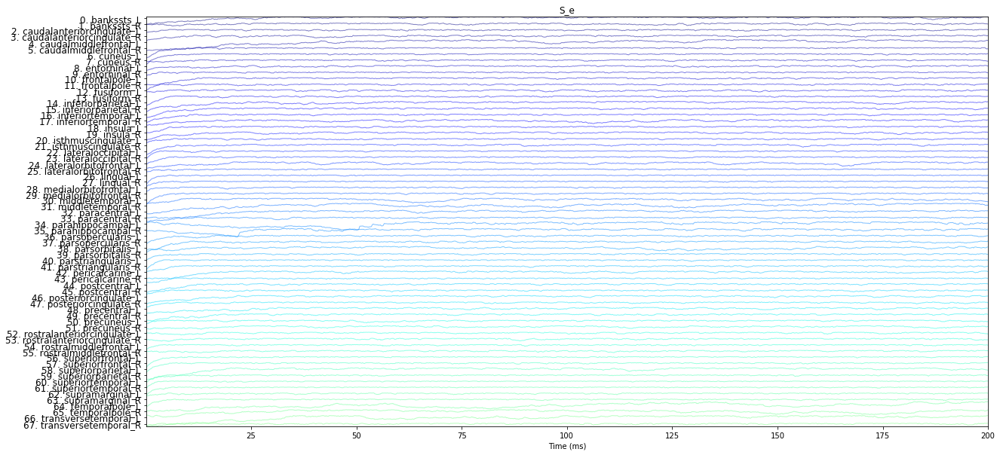

2020-01-13 16:52:35,832 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:36,211 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:36,463 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:36,813 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:37,188 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:37,437 - DEBUG - matplotlib.axes._base - update_title_pos


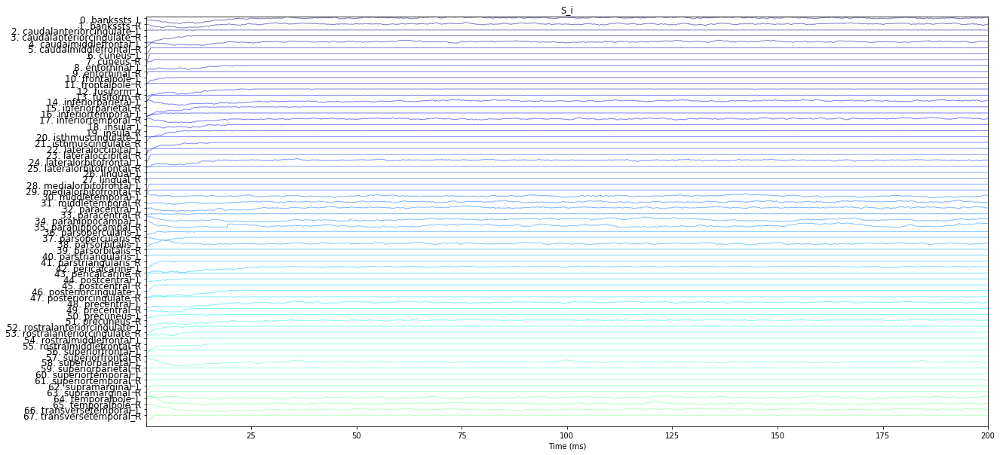

2020-01-13 16:52:37,924 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:38,331 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:38,542 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:38,830 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:39,134 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:39,322 - DEBUG - matplotlib.axes._base - update_title_pos


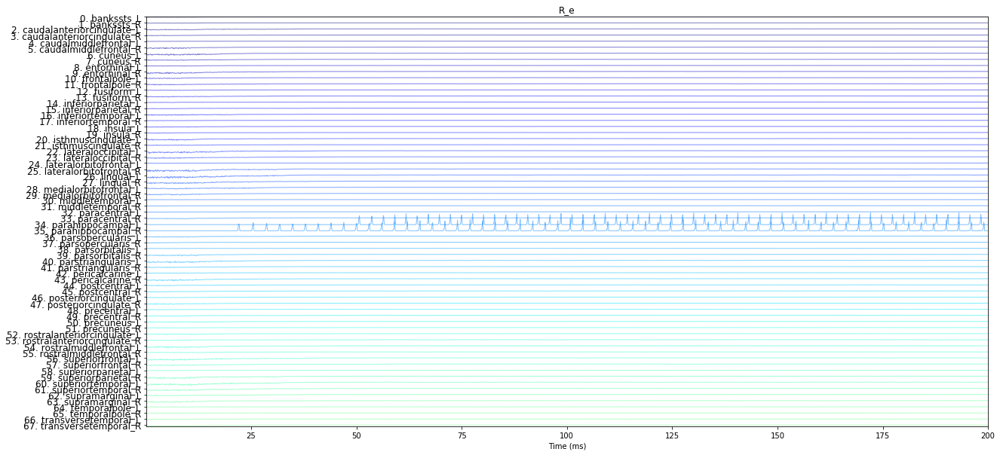

2020-01-13 16:52:39,737 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:40,060 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:40,348 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:40,784 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:41,089 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:41,303 - DEBUG - matplotlib.axes._base - update_title_pos


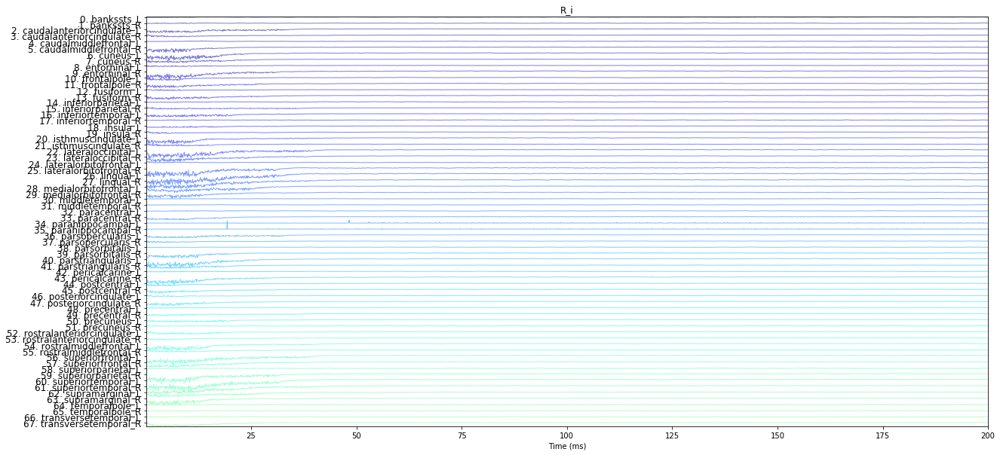

<Figure size 432x288 with 0 Axes>

In [15]:
# For raster plot:
plotter.plot_raster(S_e, title="Region S_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(S_i, title="Region S_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_e, title="Region R_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_i, title="Region R_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);

2020-01-13 16:52:41,835 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:42,259 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:42,474 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:42,787 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:42,851 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:42,888 - DEBUG - matplotlib.axes._base - update_title_pos


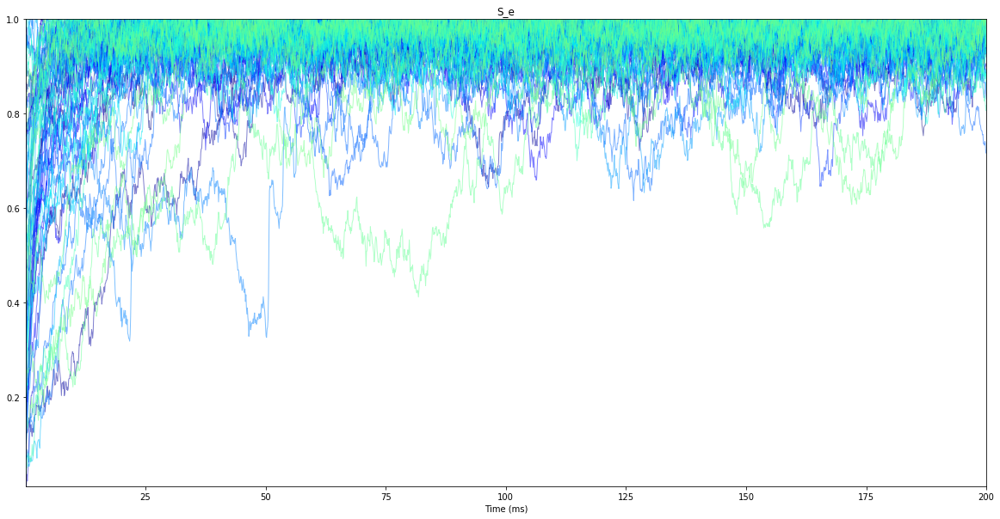

2020-01-13 16:52:43,307 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:43,634 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:43,733 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:44,027 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:44,092 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:44,131 - DEBUG - matplotlib.axes._base - update_title_pos


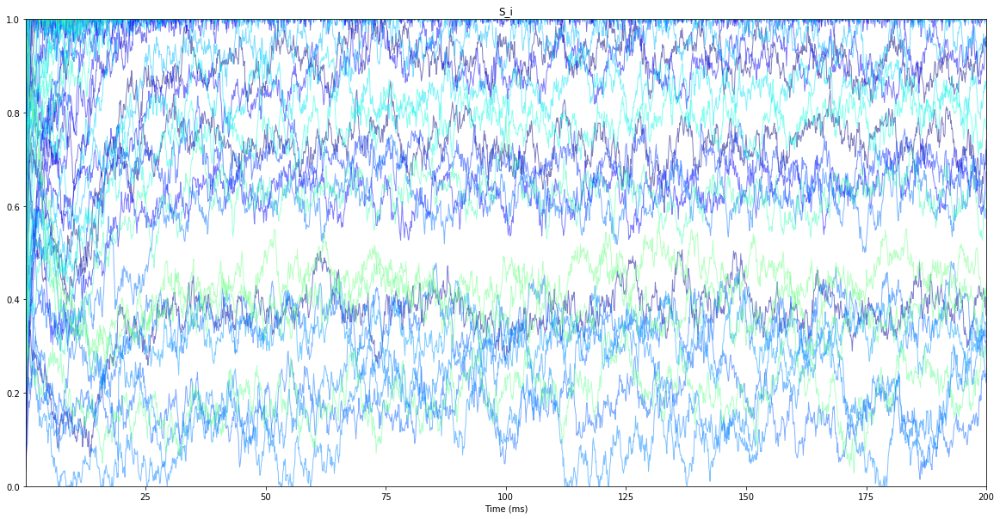

2020-01-13 16:52:44,612 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:45,017 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:45,205 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:45,499 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:45,565 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:45,609 - DEBUG - matplotlib.axes._base - update_title_pos


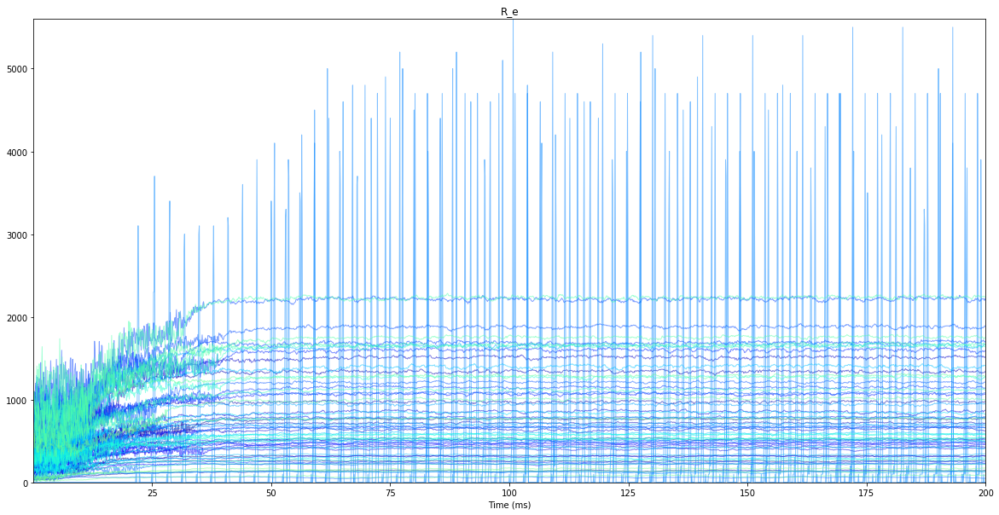

2020-01-13 16:52:46,017 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:46,488 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:46,646 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:46,931 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:46,983 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,021 - DEBUG - matplotlib.axes._base - update_title_pos


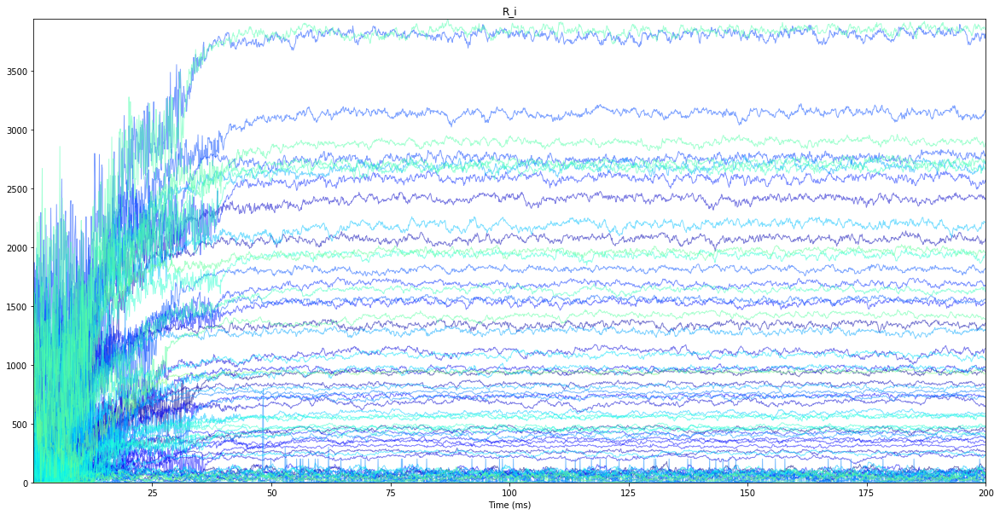

<Figure size 432x288 with 0 Axes>

In [16]:
# For timeseries plot:
plotter.plot_timeseries(S_e, title="Region S_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(S_i, title="Region S_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(R_e, title="Region R_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(R_i, title="Region R_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);

In [17]:
# # For timeseries plot:
# plotter.plot_timeseries(S_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region S_e Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(S_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region S_i Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(R_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region R_e Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(R_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region R_i Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);

2020-01-13 16:52:47,377 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,510 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,531 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,609 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,637 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,649 - DEBUG - matplotlib.axes._base - update_title_pos


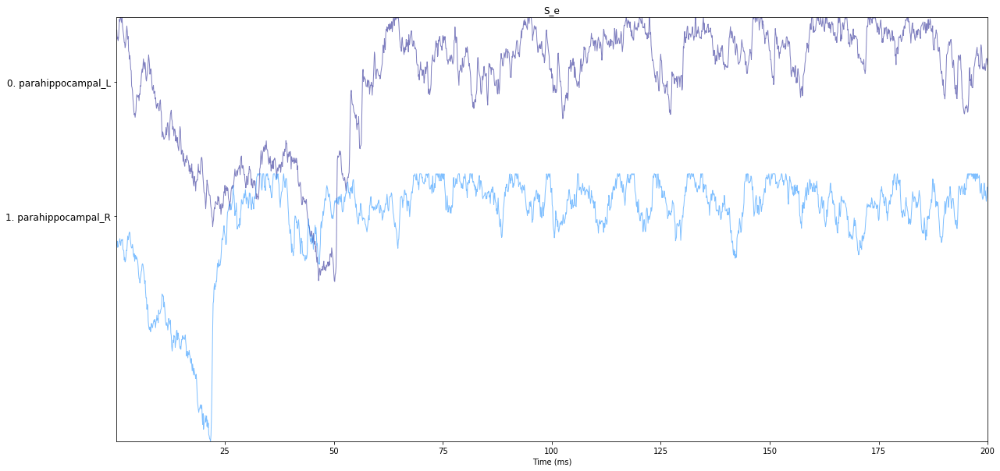

2020-01-13 16:52:47,856 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:47,996 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:48,053 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,164 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,199 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,214 - DEBUG - matplotlib.axes._base - update_title_pos


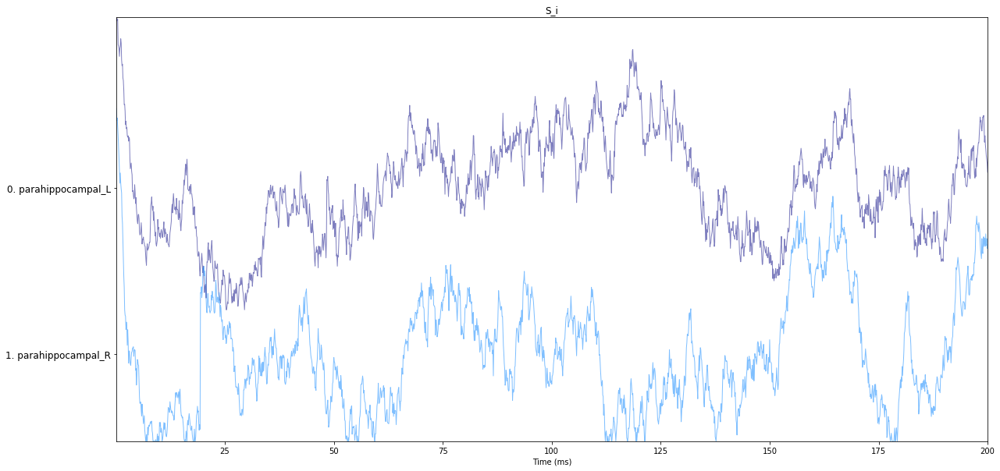

2020-01-13 16:52:48,370 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,545 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:48,607 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,772 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:48,823 - DEBUG - matplotlib.axes._base - update_title_pos


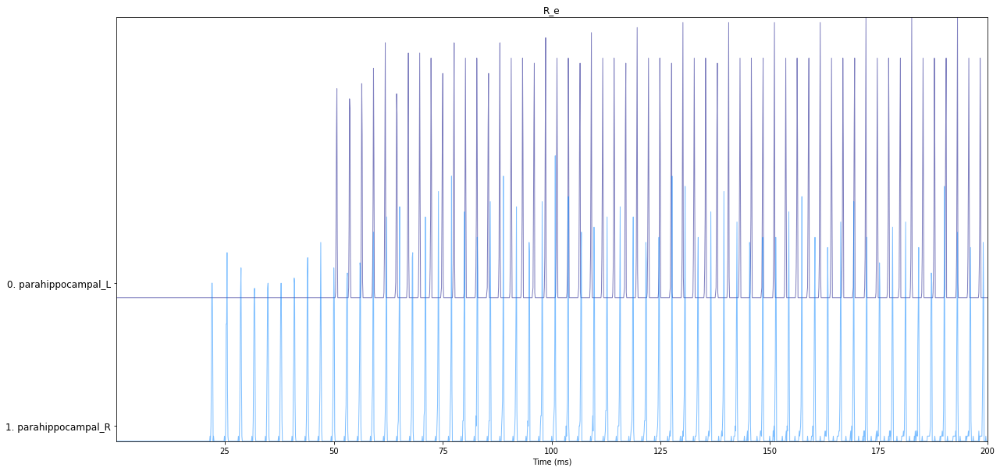

2020-01-13 16:52:48,990 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:49,108 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:52:49,137 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:49,230 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:49,254 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:52:49,273 - DEBUG - matplotlib.axes._base - update_title_pos


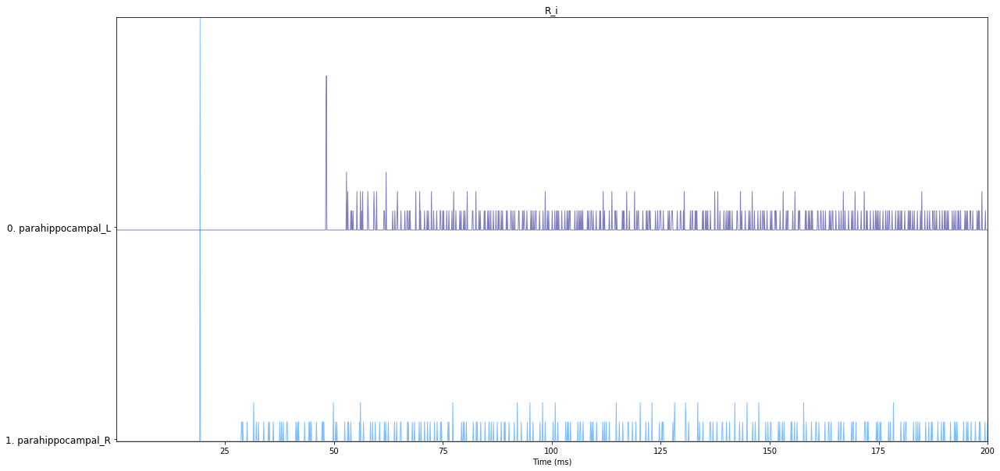

<Figure size 432x288 with 0 Axes>

In [18]:
# For raster plot:
plotter.plot_raster(S_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                    title="Region S_e Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(S_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                    title="Region S_i Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                    title="Region R_e Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                        title="Region R_i Time Series Raster", 
                        figsize=config.figures.NOTEBOOK_SIZE);

### Interactive time series plot

In [19]:
# # ...interactively as well
# # For interactive plotting:
# %matplotlib notebook 
# # Use this to skip completely the tvb-scripts plotter
# # from tvb.simulator.plot.timeseries_interactive import TimeSeriesInteractive
# # tvb_plotter = TimeSeriesInteractive(time_series=source_ts._tvb)
# # tvb_plotter.configure()
# # tvb_plotter.show()
# plotter.plot_timeseries_interactive(source_ts)

### Plot population mean membrane potential time series

In [20]:
%matplotlib inline 
# Plot NEST multimeter variables
multimeter_mean_data = tvb_nest_model.get_mean_data_from_multimeter_to_TVBTimeSeries()
# print(multimeter_mean_data)
# print(multimeter_mean_data.variables_labels)

2020-01-13 16:52:49,376 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [21]:
# Substitute the per-region synaptic variables with their sums to reduce outputs:

s_AMPA_ext = multimeter_mean_data.get_state_variables_by_label(
            ['s_AMPA_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
            title="Mean population s_AMPA_ext from NEST multimeter")
I_AMPA_ext = multimeter_mean_data.get_state_variables_by_label(
            ['I_AMPA_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
            title="Mean population I_AMPA_ext from NEST multimeter")
spikes_exc_ext = multimeter_mean_data.get_state_variables_by_label(
                ['spikes_exc_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
                title="Mean population spikes_exc_ext from NEST multimeter")
s_AMPA_ext_nest_nodes = s_AMPA_ext.get_state_variables_by_label(
                        ['s_AMPA_ext_%d' % node_id for node_id in tvb_nest_model.spiking_nodes_ids], 
                        title="Mean population s_AMPA_ext_nest_nodes from NEST multimeter")
I_AMPA_ext_nest_nodes = I_AMPA_ext.get_state_variables_by_label(
                        ['I_AMPA_ext_%d' % node_id for node_id in tvb_nest_model.spiking_nodes_ids], 
                        title="Mean population I_AMPA_ext_nest_nodes from NEST multimeter")
spikes_exc_ext_nest_nodes = spikes_exc_ext.get_state_variables_by_label(
                            ['spikes_exc_ext_%d' % node_id for node_id in tvb_nest_model.spiking_nodes_ids], 
                            title="Mean population spikes_exc_ext_nest_nodes from NEST multimeter")

from tvb_scripts.time_series.service import TimeSeriesService
ts_service = TimeSeriesService()
s_AMPA_ext_tot = ts_service.sum_across_dimension(s_AMPA_ext, 1, 
                                                 title="Mean population s_AMPA_ext_tot from NEST multimeter")
s_AMPA_ext_tot.labels_dimensions["Variable"] = ["s_AMPA_ext_tot"]
I_AMPA_ext_tot = ts_service.sum_across_dimension(I_AMPA_ext, 1, 
                                                 title="Mean population I_AMPA_ext_tot from NEST multimeter")
I_AMPA_ext_tot.labels_dimensions["Variable"] = ["I_AMPA_ext_tot"]
spikes_exc_ext_tot = ts_service.sum_across_dimension(spikes_exc_ext, 1, 
                                                     title="Mean population spikes_exc_ext_tot from NEST multimeter")
spikes_exc_ext_tot.labels_dimensions["Variable"] = ["spikes_exc_ext_tot"]

multimeter_mean_data_ext = \
    ts_service.concatenate_variables([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot, 
                                      spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes])

multimeter_mean_data_exc = multimeter_mean_data.get_state_variables_by_label(
            ['spikes_exc', 's_AMPA', 'I_AMPA', 'x_NMDA', 's_NMDA', 'I_NMDA'], 
            title="Mean exciatory synapse data from NEST multimeter")
    
multimeter_mean_data_inh = multimeter_mean_data.get_state_variables_by_label(
            ['spikes_inh', 's_GABA', 'I_GABA'], 
           title="Mean inhibitory synapse data from NEST multimeter")
    
multimeter_mean_data_neuron = multimeter_mean_data.get_state_variables_by_label(
            ['V_m', 'I_L', 'I_e'], 
            title="Mean external synapse data from NEST multimeter")

In [22]:
# for data, label in zip([multimeter_mean_data_neuron, multimeter_mean_data_exc,
#                         multimeter_mean_data_inh, multimeter_mean_data_ext], 
#                        ["", " Excitatory synapses ", " Inhibitory synapses ", " External synapses "]):
#     plotter.plot_multimeter_raster(data, plot_per_variable=True,
#                                    time_series_class=TimeSeriesRegion, 
#                                    time_series_args={}, var_pop_join_str=" - ", 
#                                    default_population_label="population",
#                                    title="NEST region %stime series raster" % label)

2020-01-13 16:54:28,375 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,431 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,582 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,619 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,666 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,697 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,830 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,869 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,961 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:28,996 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,032 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,102 - DEBUG - matplotlib.axes._base - update_title_pos


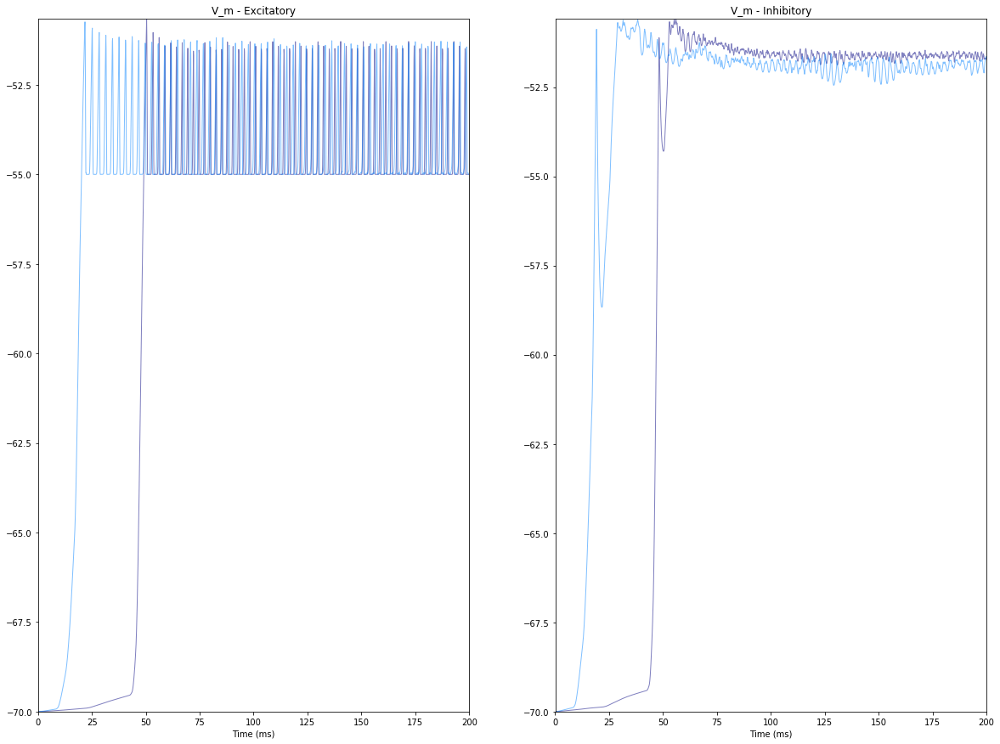

2020-01-13 16:54:29,290 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,367 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,572 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,608 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:29,655 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,694 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,842 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,873 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,934 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,962 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:29,995 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,037 - DEBUG - matplotlib.axes._base - update_title_pos


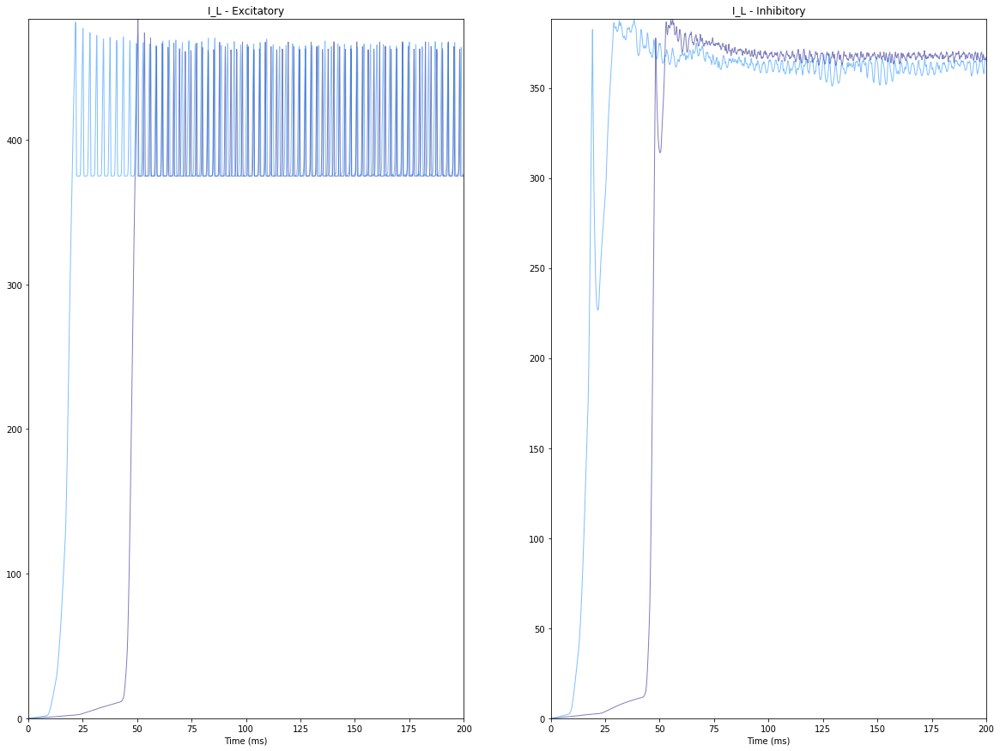

2020-01-13 16:54:30,201 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,244 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,351 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,375 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:30,407 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,425 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,519 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,541 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,577 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,598 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,621 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,643 - DEBUG - matplotlib.axes._base - update_title_pos


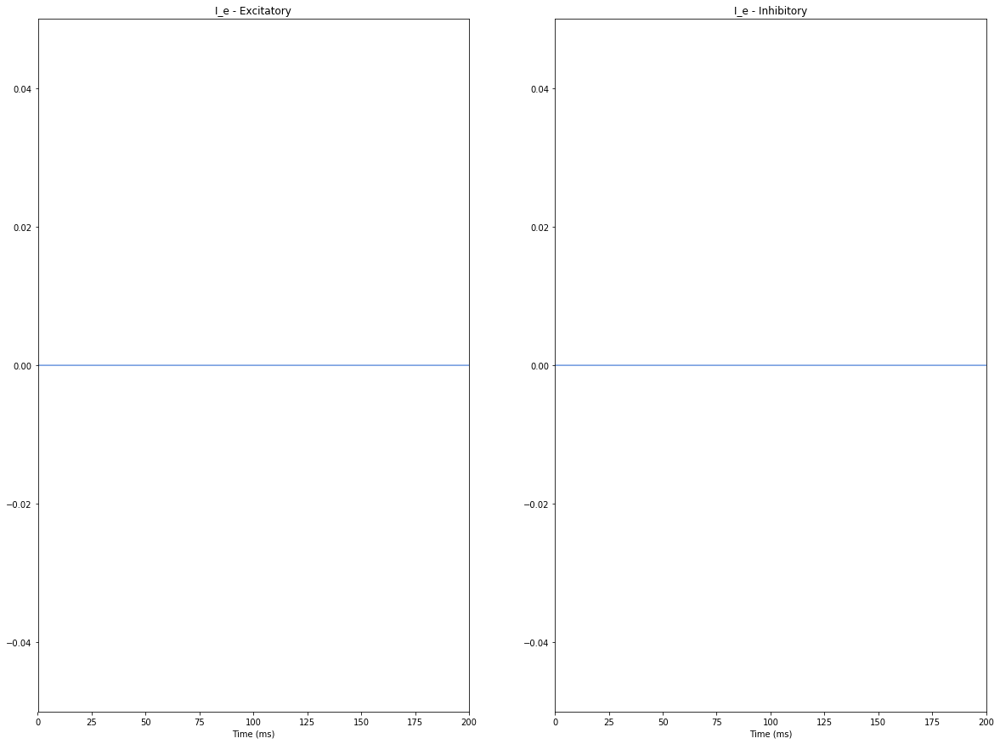

2020-01-13 16:54:30,746 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,783 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,904 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:30,939 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:30,987 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,019 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,124 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,138 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,168 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,193 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,209 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,240 - DEBUG - matplotlib.axes._base - update_title_pos


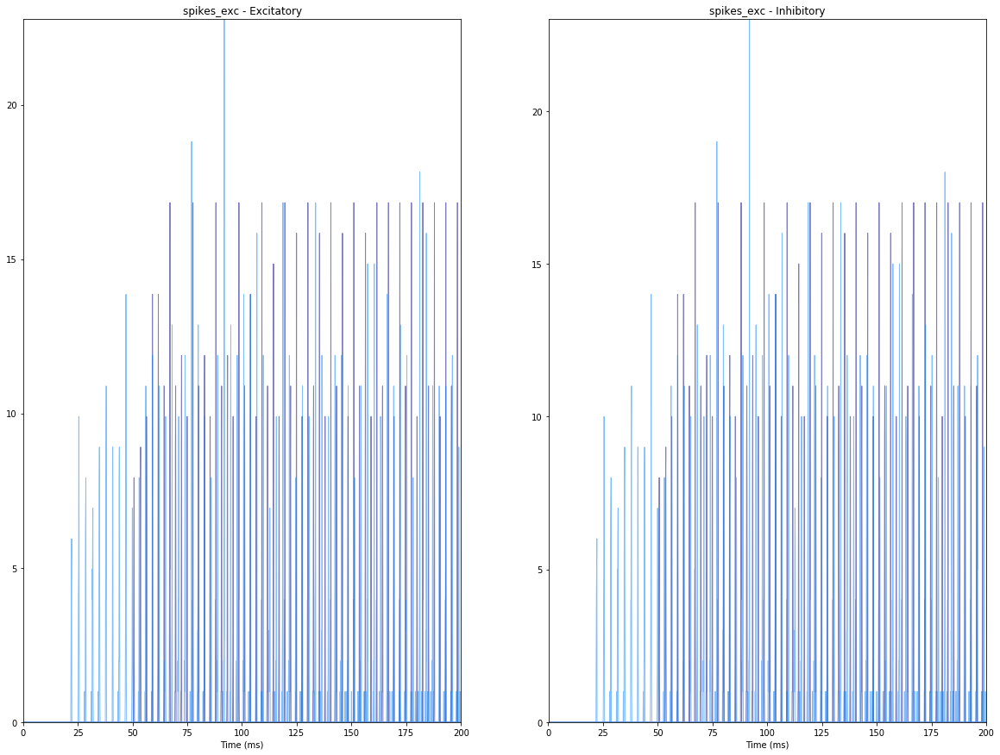

2020-01-13 16:54:31,398 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,439 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,623 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,649 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:31,682 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,708 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,860 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,877 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,907 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,921 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,936 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:31,971 - DEBUG - matplotlib.axes._base - update_title_pos


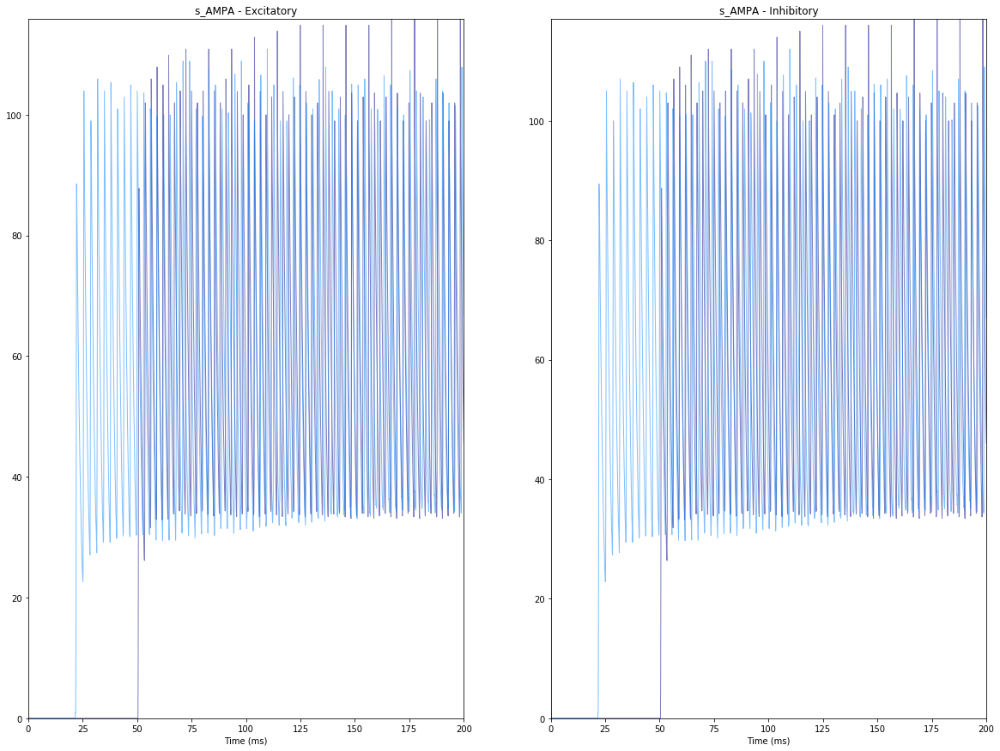

2020-01-13 16:54:32,210 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,261 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,516 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,560 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:32,609 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,658 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,895 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,918 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,964 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:32,987 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,009 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,049 - DEBUG - matplotlib.axes._base - update_title_pos


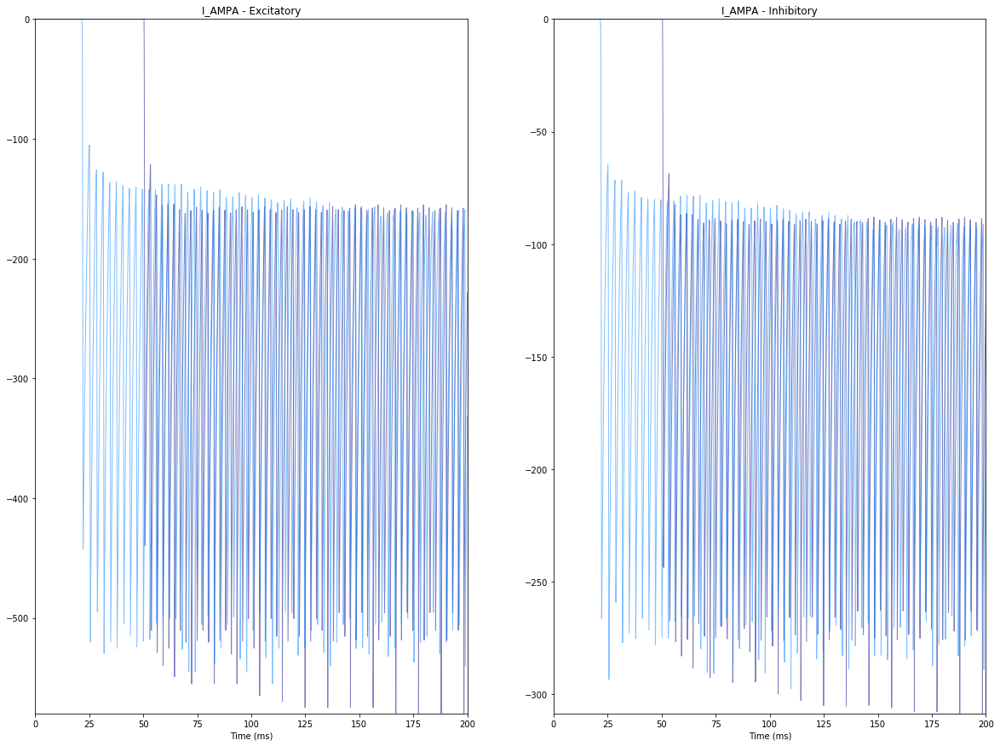

2020-01-13 16:54:33,291 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,348 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,613 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,647 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:33,703 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,743 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,961 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:33,987 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,034 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,061 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,083 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,130 - DEBUG - matplotlib.axes._base - update_title_pos


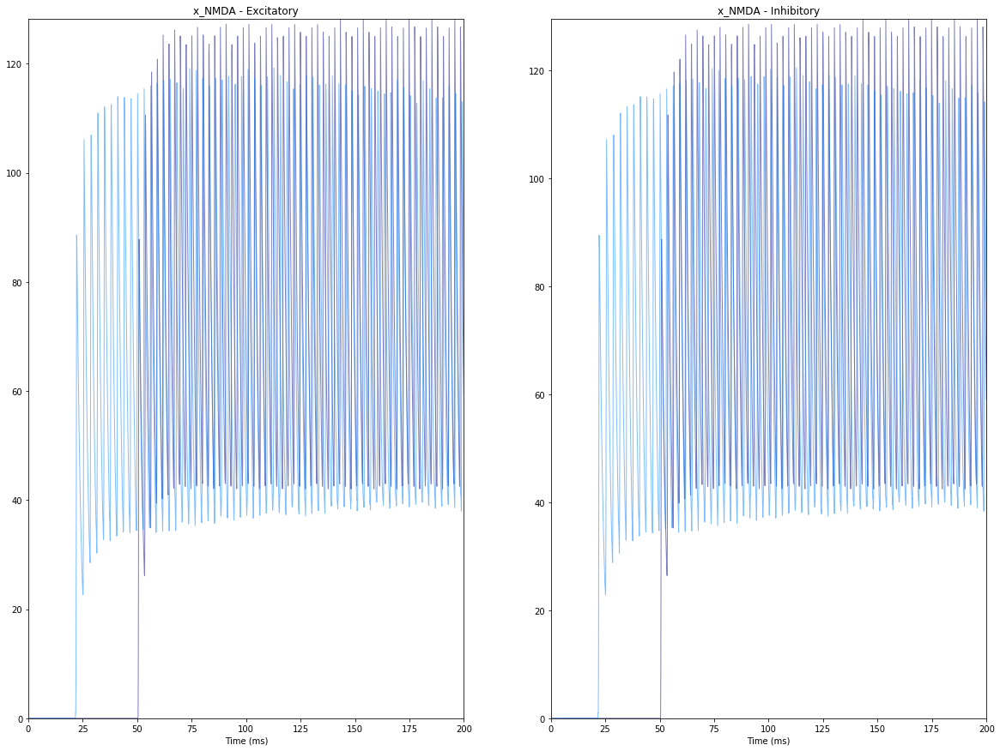

2020-01-13 16:54:34,362 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,397 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,497 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,516 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:34,541 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,559 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,639 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,659 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,688 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,703 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,717 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,735 - DEBUG - matplotlib.axes._base - update_title_pos


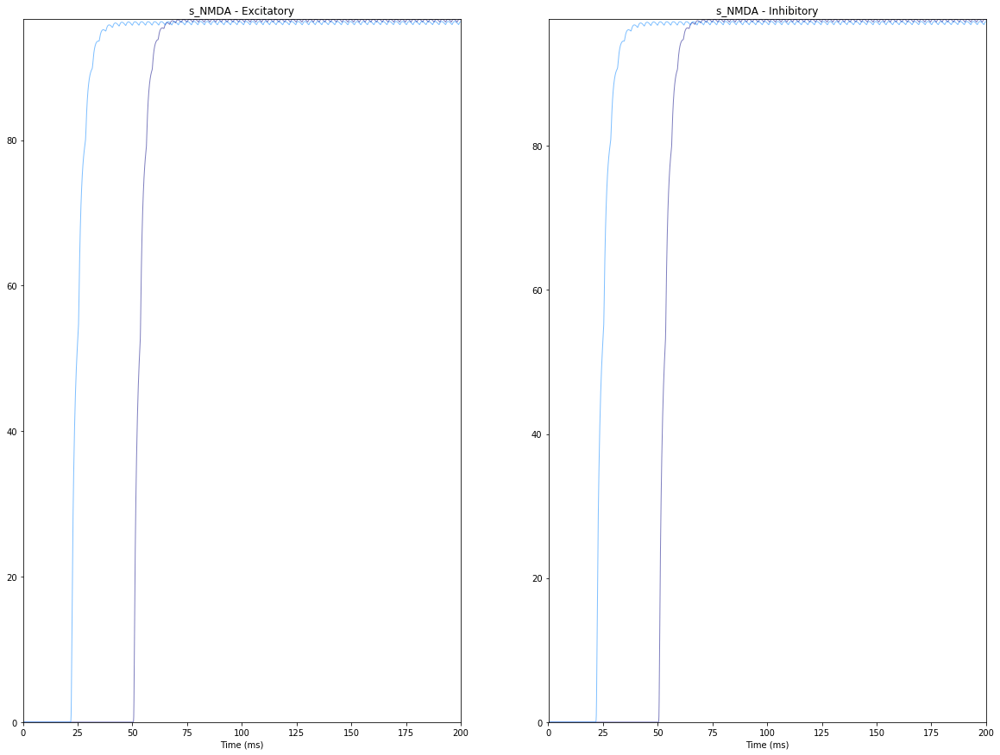

2020-01-13 16:54:34,836 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,874 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:34,991 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,013 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:35,042 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,065 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,152 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,169 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,200 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,233 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,261 - DEBUG - matplotlib.axes._base - update_title_pos


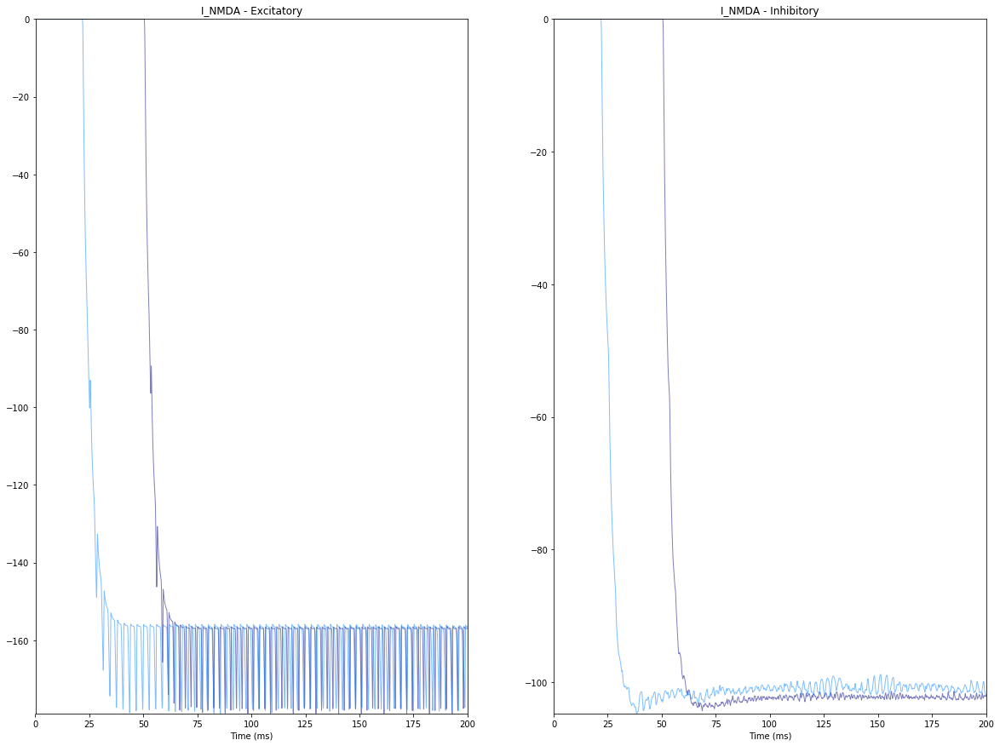

2020-01-13 16:54:35,372 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,402 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,504 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,524 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:35,555 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,583 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,682 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,700 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,736 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,753 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,772 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,802 - DEBUG - matplotlib.axes._base - update_title_pos


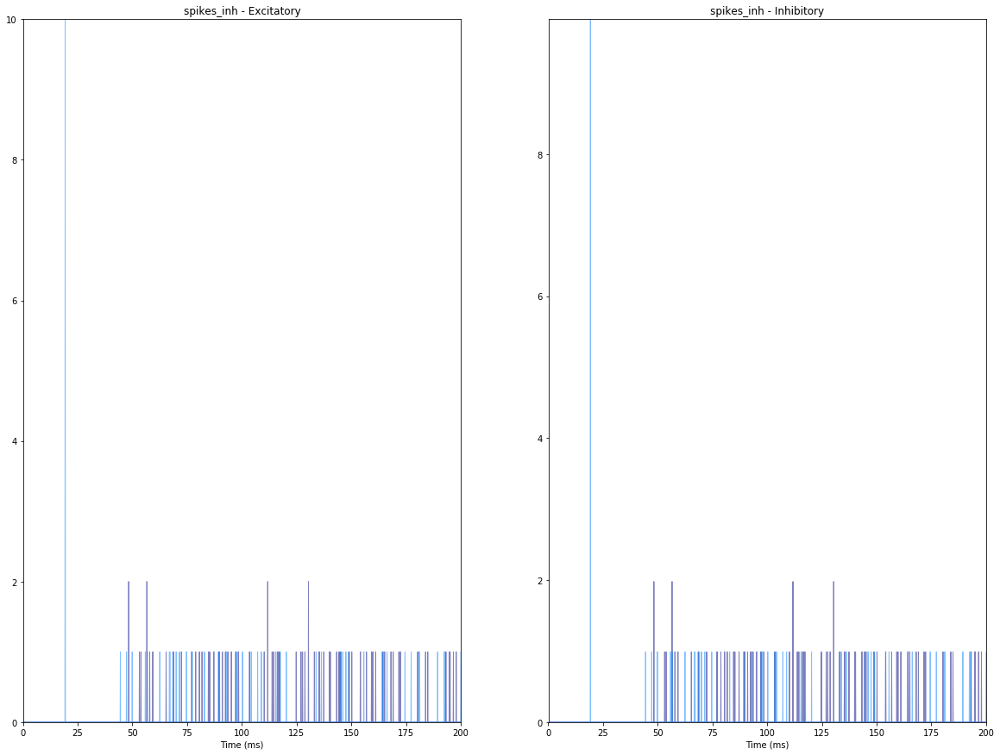

2020-01-13 16:54:35,906 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:35,944 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,148 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,173 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:36,212 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,245 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,400 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,431 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,492 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,526 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,552 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,641 - DEBUG - matplotlib.axes._base - update_title_pos


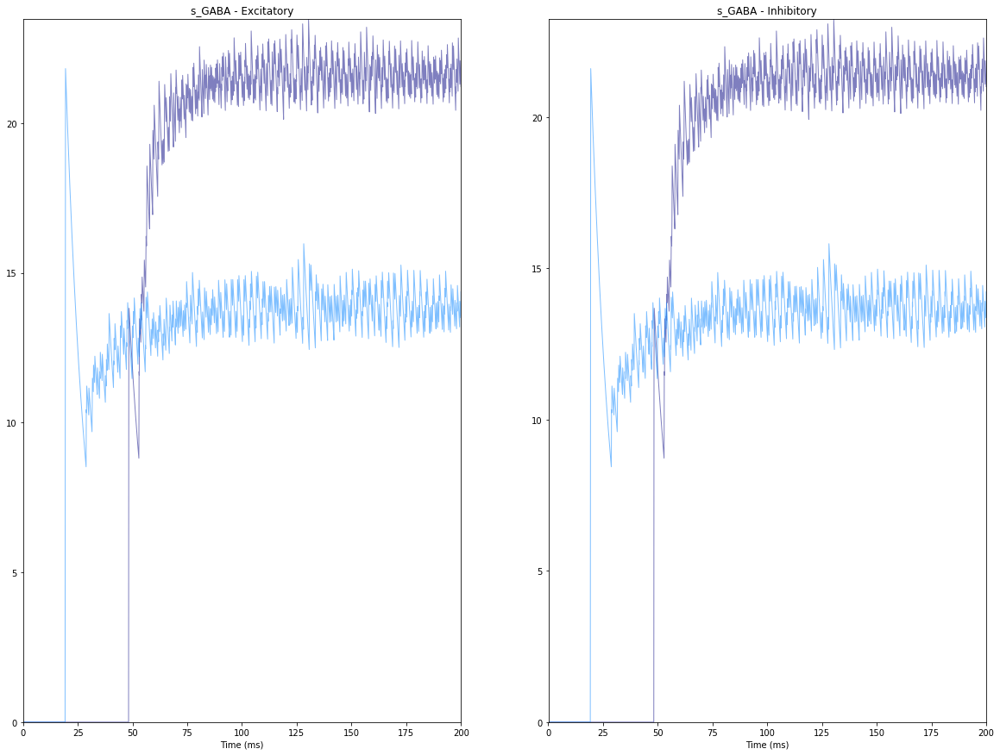

2020-01-13 16:54:36,836 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:36,893 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,098 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,126 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:37,174 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,205 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,353 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,380 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,427 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,448 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,472 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,507 - DEBUG - matplotlib.axes._base - update_title_pos


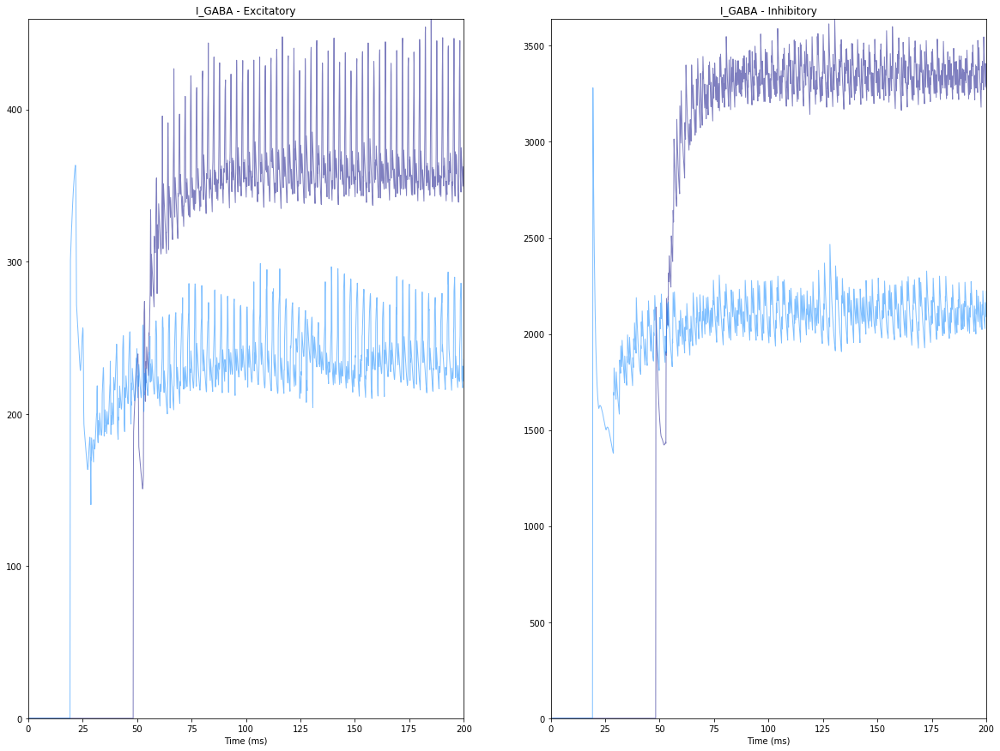

2020-01-13 16:54:37,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:37,865 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,010 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,039 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:38,075 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,101 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,209 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,233 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,278 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,301 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,325 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,366 - DEBUG - matplotlib.axes._base - update_title_pos


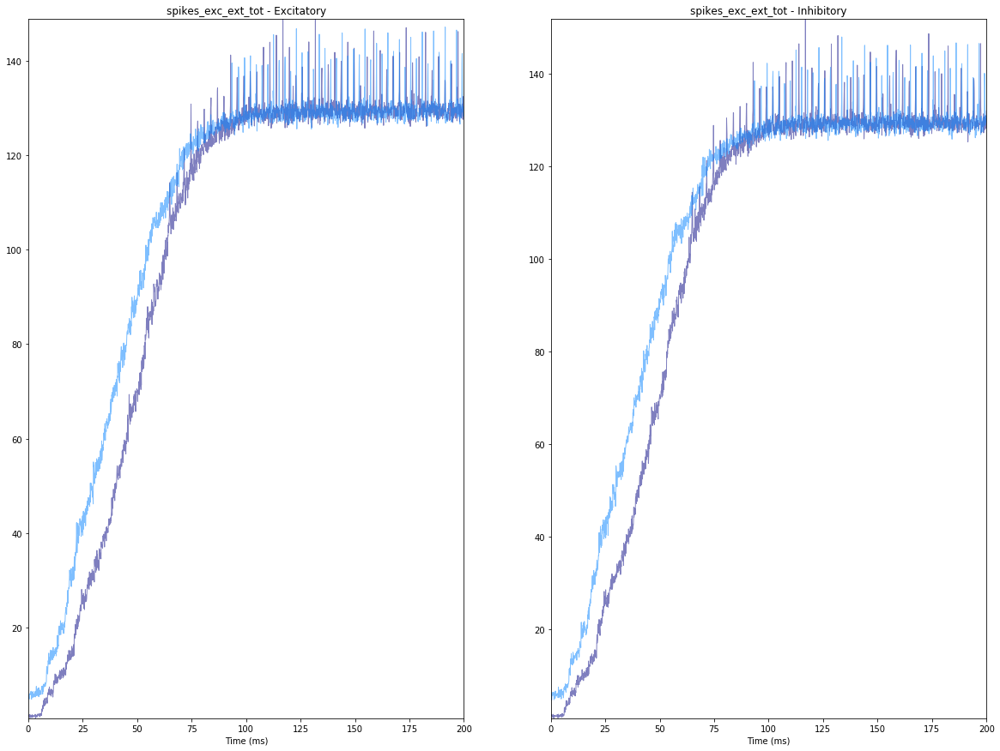

2020-01-13 16:54:38,510 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,552 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,654 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,671 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:38,695 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,712 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,788 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,834 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,850 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,865 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:38,888 - DEBUG - matplotlib.axes._base - update_title_pos


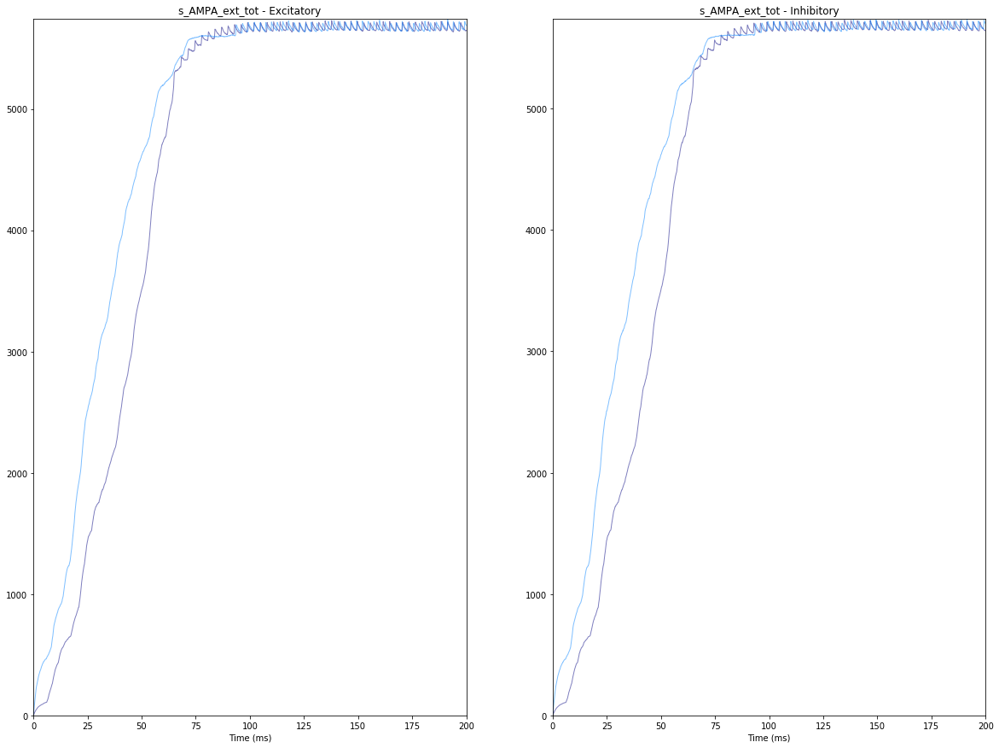

2020-01-13 16:54:38,982 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,014 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,129 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,147 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:39,175 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,192 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,276 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,294 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,323 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,337 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,351 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,373 - DEBUG - matplotlib.axes._base - update_title_pos


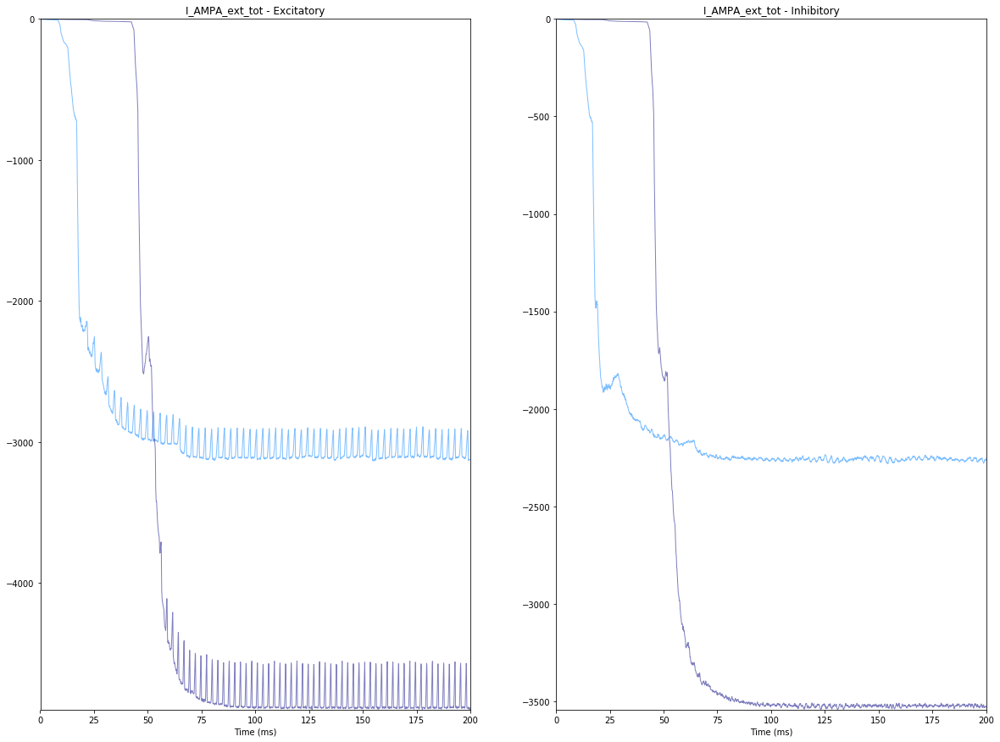

2020-01-13 16:54:39,469 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,504 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,611 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,630 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:39,658 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,678 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,769 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,792 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,825 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,842 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,857 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:39,882 - DEBUG - matplotlib.axes._base - update_title_pos


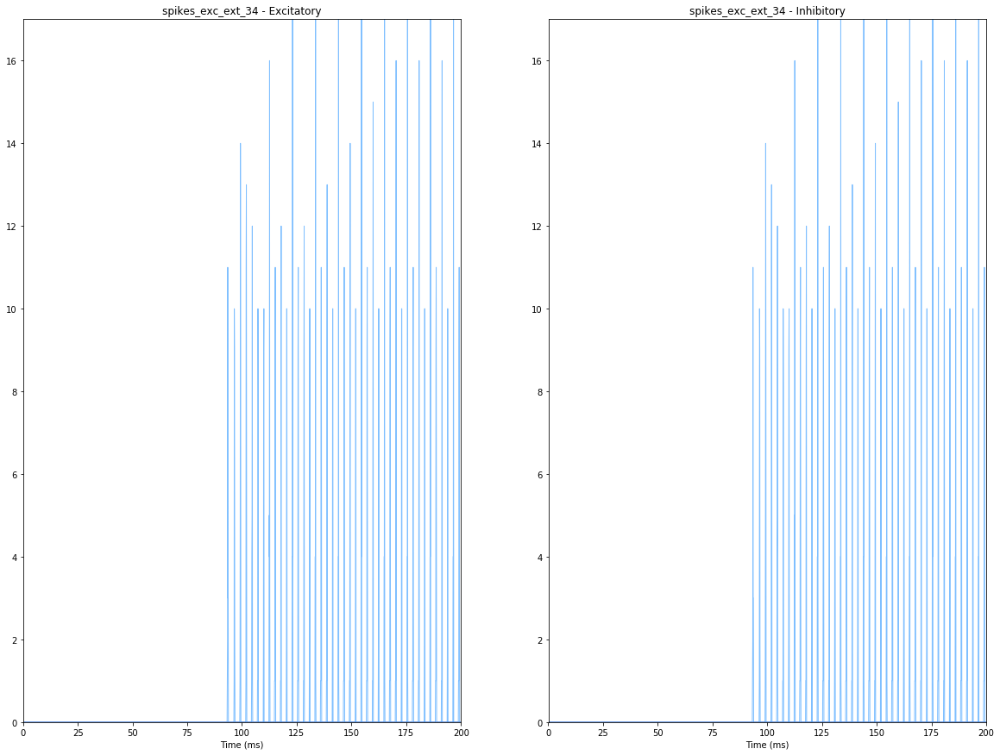

2020-01-13 16:54:39,977 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,021 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,186 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,222 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:40,262 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,297 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,411 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,435 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,479 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,505 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,531 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,566 - DEBUG - matplotlib.axes._base - update_title_pos


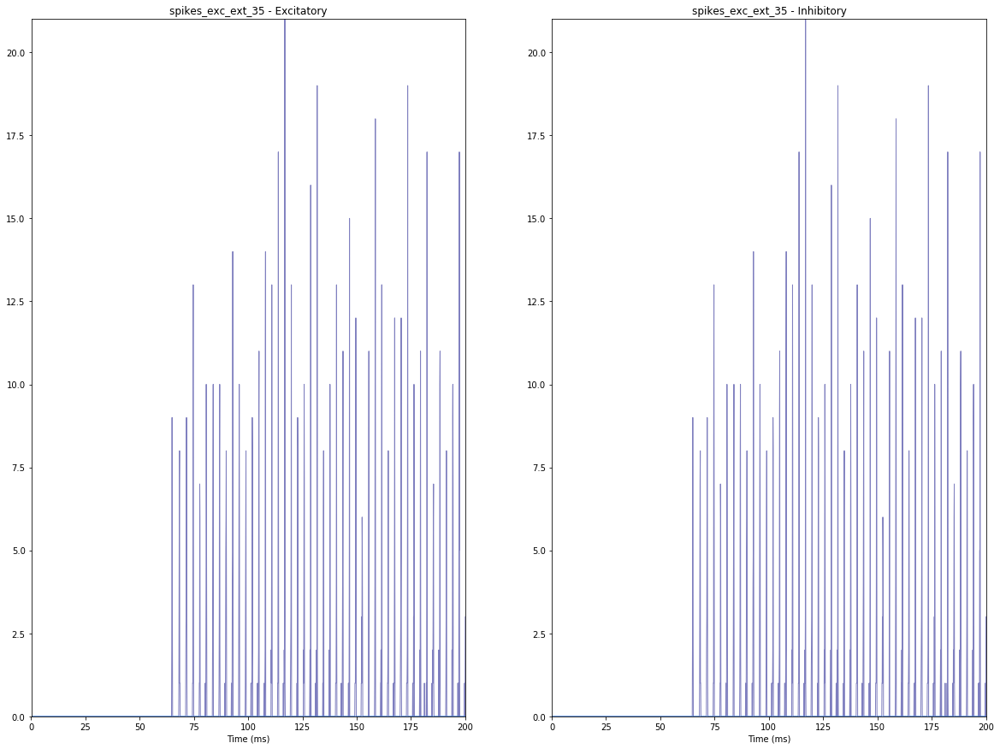

2020-01-13 16:54:40,729 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,780 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,942 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:40,982 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:41,021 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,047 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,179 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,206 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,257 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,287 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,307 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,354 - DEBUG - matplotlib.axes._base - update_title_pos


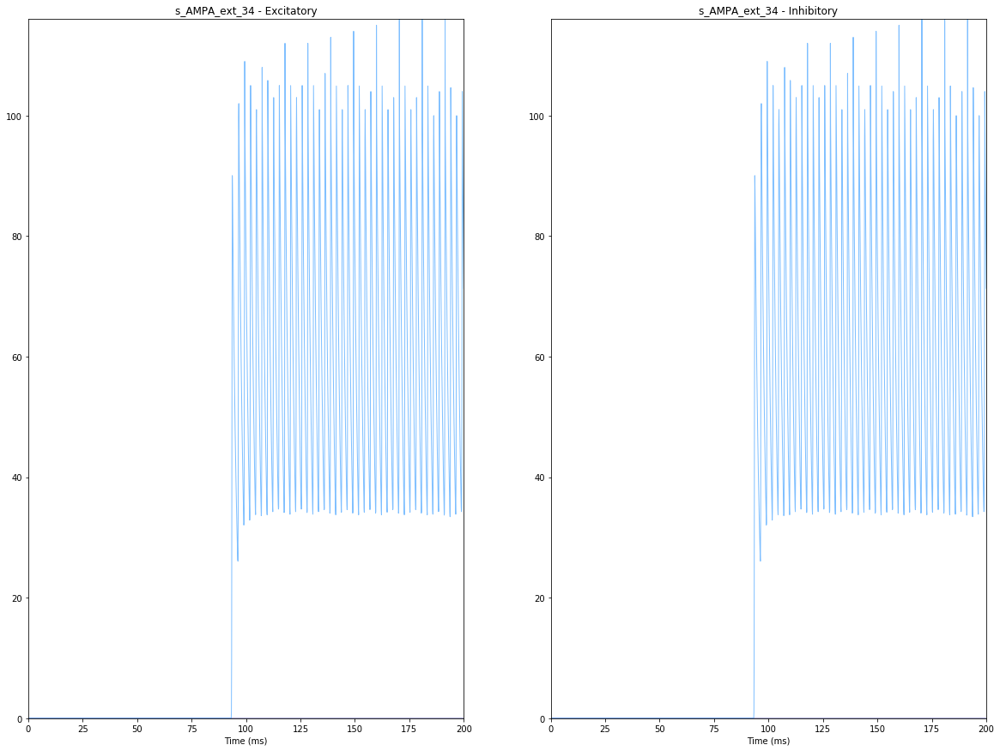

2020-01-13 16:54:41,514 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,559 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,697 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,716 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:41,743 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,763 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,867 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,881 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,912 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,927 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,941 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:41,965 - DEBUG - matplotlib.axes._base - update_title_pos


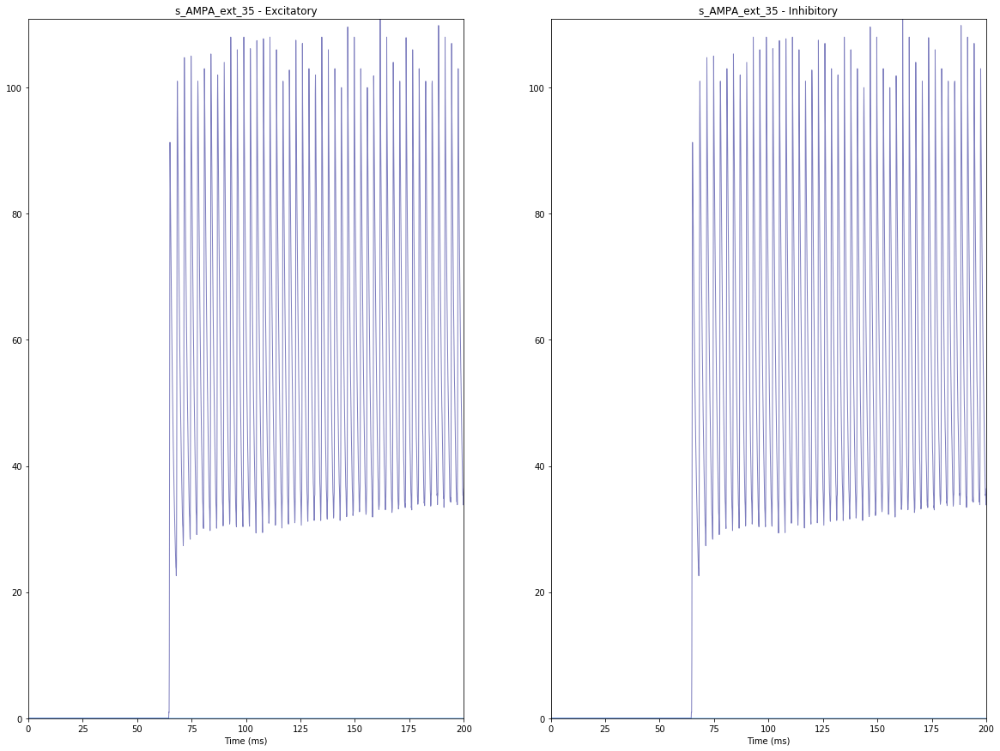

2020-01-13 16:54:42,112 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,149 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,274 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,295 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:42,323 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,344 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,453 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,470 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,503 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,517 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,535 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,558 - DEBUG - matplotlib.axes._base - update_title_pos


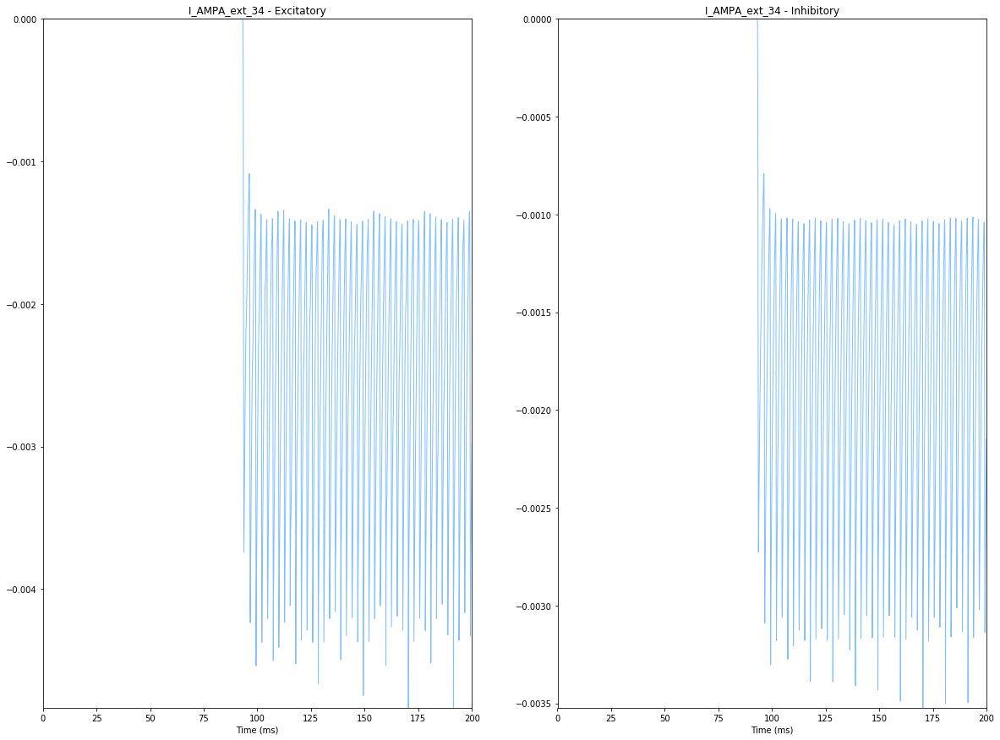

2020-01-13 16:54:42,671 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,699 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,831 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,850 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-13 16:54:42,878 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:42,896 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:43,066 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:43,088 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:43,134 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:43,157 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:43,178 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:43,213 - DEBUG - matplotlib.axes._base - update_title_pos


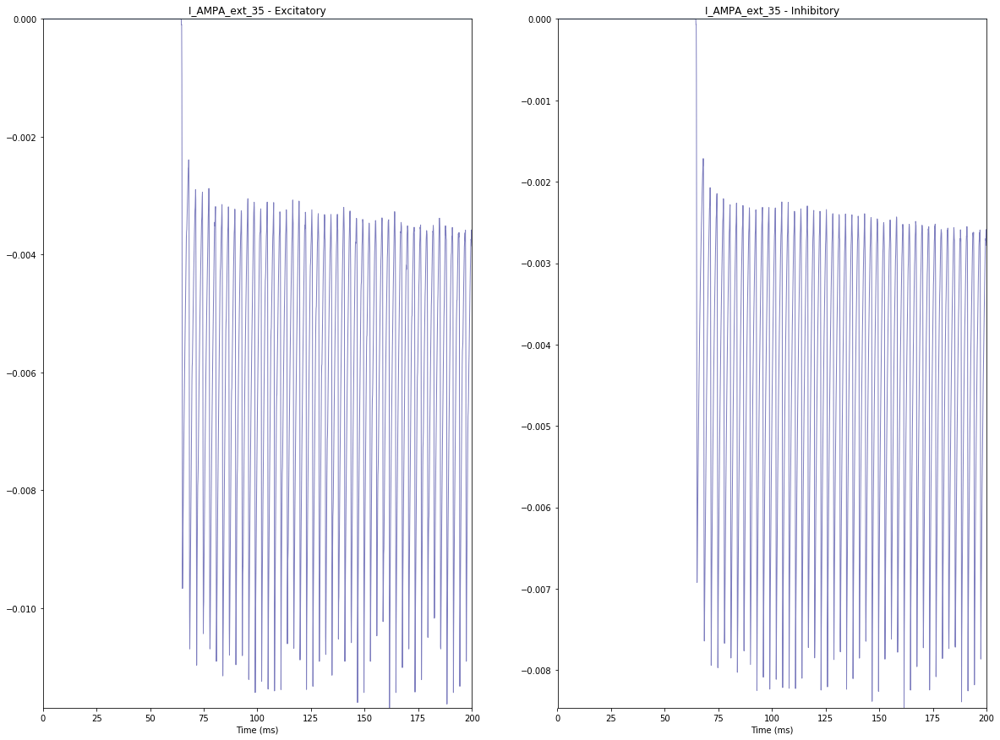

<Figure size 432x288 with 0 Axes>

In [23]:
for data, label in zip([multimeter_mean_data_neuron, multimeter_mean_data_exc,
                        multimeter_mean_data_inh, multimeter_mean_data_ext], 
                       ["", " Excitatory synapses ", " Inhibitory synapses ", " External synapses "]):    
    plotter.plot_multimeter_timeseries(data, plot_per_variable=True,
                                       time_series_class=TimeSeriesRegion, 
                                       time_series_args={}, var_pop_join_str=" - ", 
                                       default_population_label="population",
                                       title="NEST region %stime series" % label)

### Plot spikes' raster and mean spike rate for NEST regions

2020-01-13 16:54:43,995 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,025 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,062 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,079 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,212 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,238 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,272 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,290 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,321 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,348 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,377 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,391 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,505 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:54:44,525 -

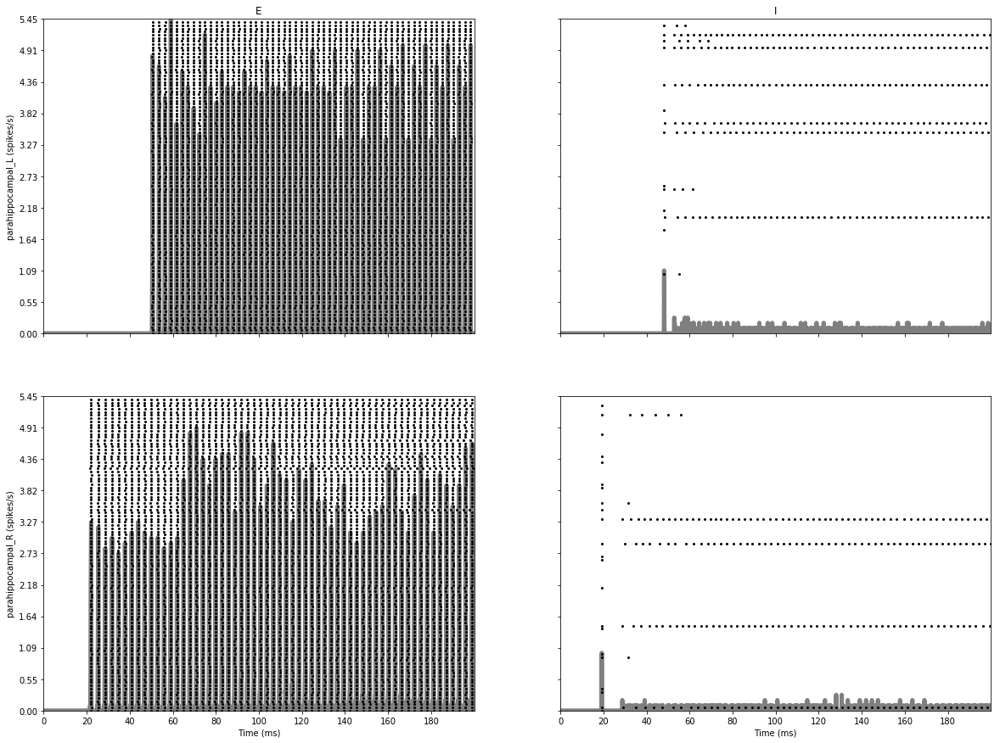

<Figure size 432x288 with 0 Axes>

In [24]:
# Plot spikes and mean field spike rates
rates, spike_detectors = \
    tvb_nest_model.get_mean_spikes_rates_to_TVBTimeSeries(
        spikes_kernel_width= simulator.integrator.dt,  # ms
        spikes_kernel_overlap=0.0, time=t)
if spike_detectors is not None:
    plotter.plot_spikes(spike_detectors, rates=rates, title='Population spikes and mean spike rate')

### Plotting NEST network activity using xarray

In [25]:
from tvb_scripts.time_series.time_series_xarray import TimeSeries as TimeSeriesXarray
import xarray as xr

multimeter_mean_data = nest_network.get_mean_data_from_multimeter()
ts = TimeSeriesXarray(multimeter_mean_data)
print(ts)

ts_exc = ts[:, ["spikes_exc", "s_AMPA", "I_AMPA", "x_NMDA", "s_NMDA", "I_NMDA"]]
ts_exc._data.name = "Mean excitatory synapse data from NEST multimeter"
print(ts_exc)
ts_inh = ts[:, ["spikes_inh", "s_GABA", "I_GABA"]]
ts_inh._data.name = "Mean inhibitory synapse data from NEST multimeter"

# Substitute the per-region synaptic variables with their sums to reduce outputs:
s_AMPA_ext_nest_nodes = ts[:, ['s_AMPA_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data
I_AMPA_ext_nest_nodes = ts[:, ['I_AMPA_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data
spikes_exc_ext_nest_nodes = ts[:, ['spikes_exc_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data

s_AMPA_ext_tot = \
    ts[:, ['s_AMPA_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["s_AMPA_ext_tot"]})
I_AMPA_ext_tot = \
    ts[:, ['I_AMPA_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["I_AMPA_ext_tot"]})
spikes_exc_ext_tot = \
    ts[:, ['spikes_exc_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["spikes_exc_ext_tot"]})

print(ts_inh)
ts_ext = TimeSeriesXarray( 
            xr.concat([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot, 
                       spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes], "Variable"))
ts_ext._data.name = "Mean external synapse data from NEST multimeter"
print(ts_ext)

ts_neuron = ts[:, ["V_m", "I_L", "I_e"]]

TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from Spiking Network multimeter
  Time-series type . TimeSeries
  [min, median, max]  [-1532.46, 0.62, 3638.54]
  dtype ............ float64
  shape ............ (2000, 216, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from Spiking Network multimeter
  Time-series type . TimeSeries
  [min, median, max]  [-579.729, 0, 129.448]
  dtype ............ float64
  shape ............ (2000, 6, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from Spiking Network multimeter
  Time-series type . TimeSeries
  [min, median, max]  [0, 13

2020-01-13 16:56:24,639 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,678 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,703 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,737 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,781 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,818 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,863 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,894 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,950 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:24,984 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,036 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,071 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,123 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,143 -

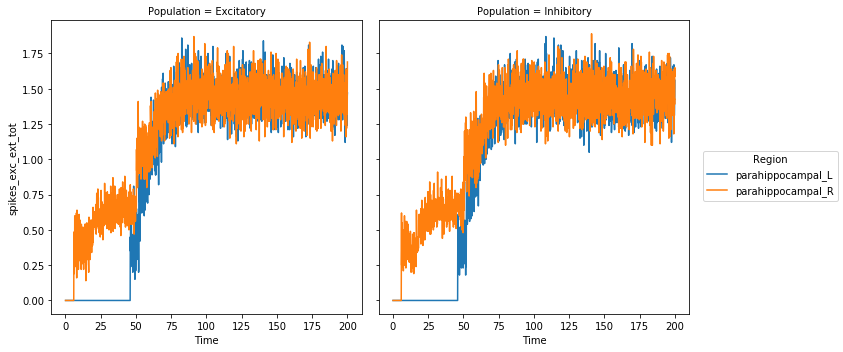

2020-01-13 16:56:25,380 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,412 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,434 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,457 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,483 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,507 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,541 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,560 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,604 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,630 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,664 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,685 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,729 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:25,748 -

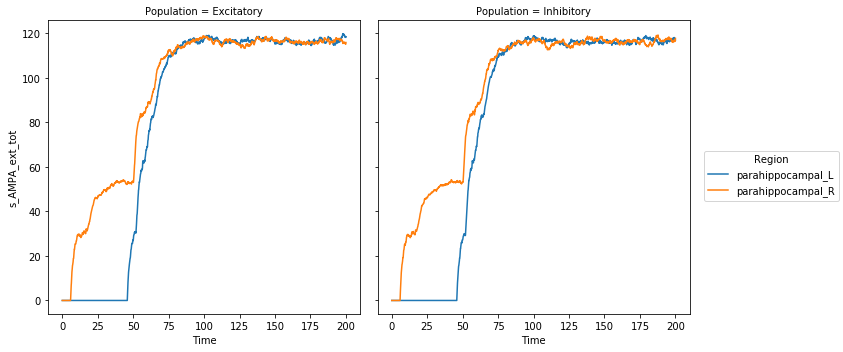

2020-01-13 16:56:26,126 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,183 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,213 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,247 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,296 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,344 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,394 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,427 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,497 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,532 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,585 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,621 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,697 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:26,745 -

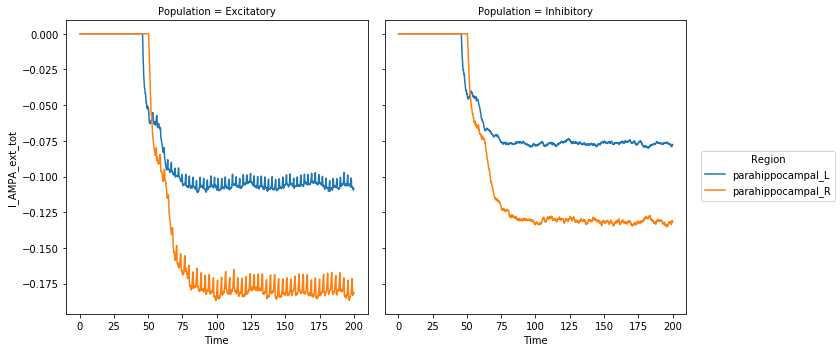

2020-01-13 16:56:27,082 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,138 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,179 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,262 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,300 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,351 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,384 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,447 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,481 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,505 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,556 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,623 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:27,656 -

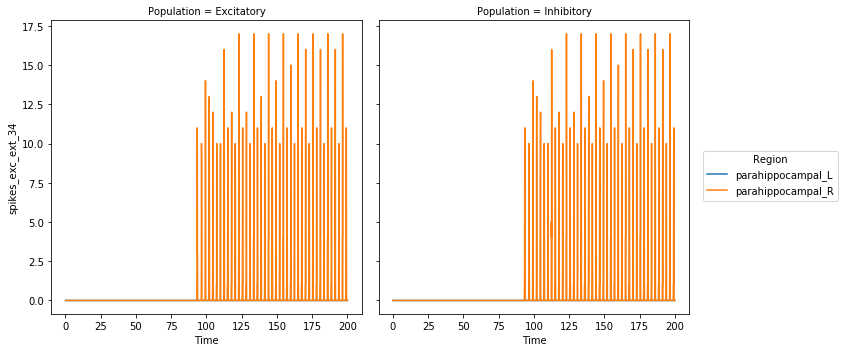

2020-01-13 16:56:27,959 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,014 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,041 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,072 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,105 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,149 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,204 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,236 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,297 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,323 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,363 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,383 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,425 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,443 -

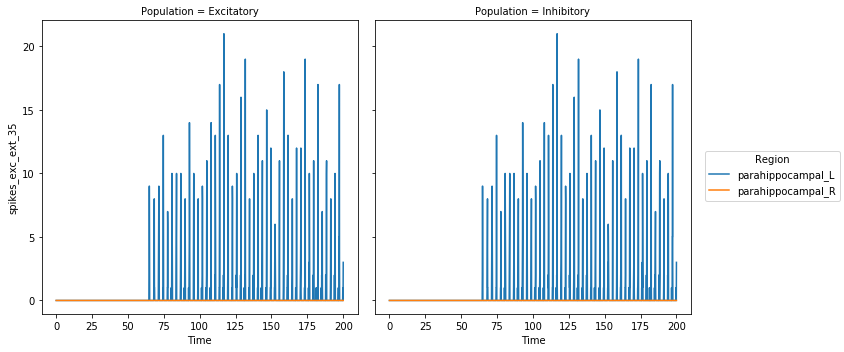

2020-01-13 16:56:28,666 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,703 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,729 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,756 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,780 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,838 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,856 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,911 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,936 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:28,988 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,016 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,071 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,091 -

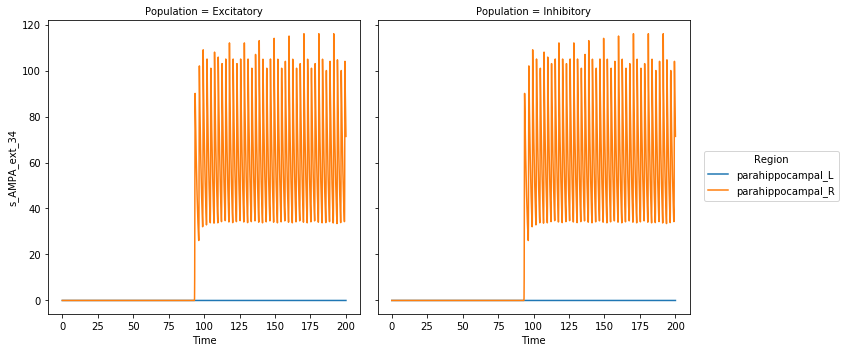

2020-01-13 16:56:29,322 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,350 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,370 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,392 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,419 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,445 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,479 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,502 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,561 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,584 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,623 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,648 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,706 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,726 -

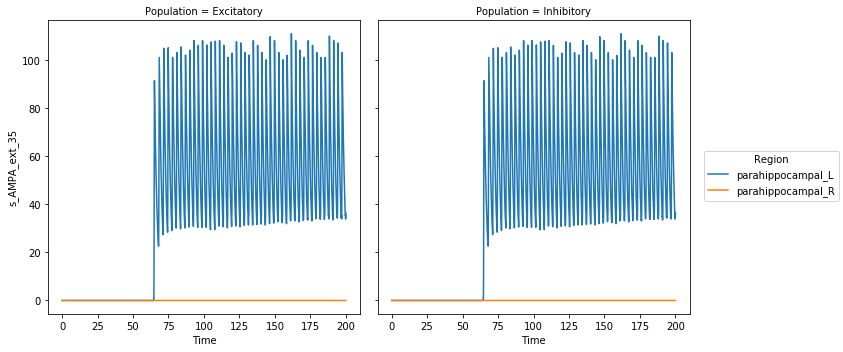

2020-01-13 16:56:29,958 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:29,983 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,010 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,064 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,120 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,154 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,197 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,231 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,314 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,347 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,417 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,473 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,560 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,593 -

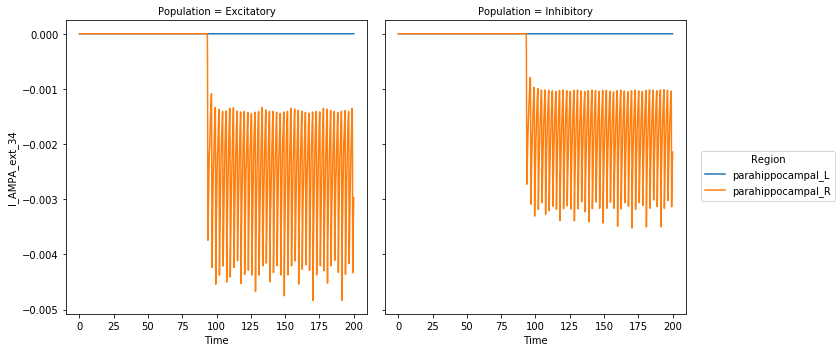

2020-01-13 16:56:30,943 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:30,990 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,026 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,063 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,104 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,143 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,197 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,230 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,318 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,369 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,442 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,496 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,593 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:31,647 -

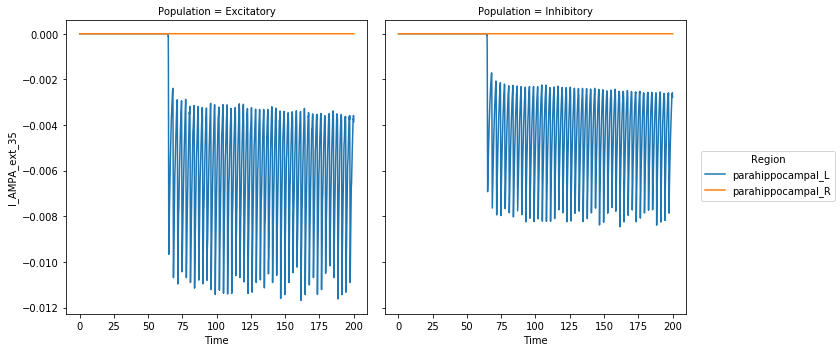

2020-01-13 16:56:32,013 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,060 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,088 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,130 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,176 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,222 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,268 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,297 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,361 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,396 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,445 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,482 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,551 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,578 -

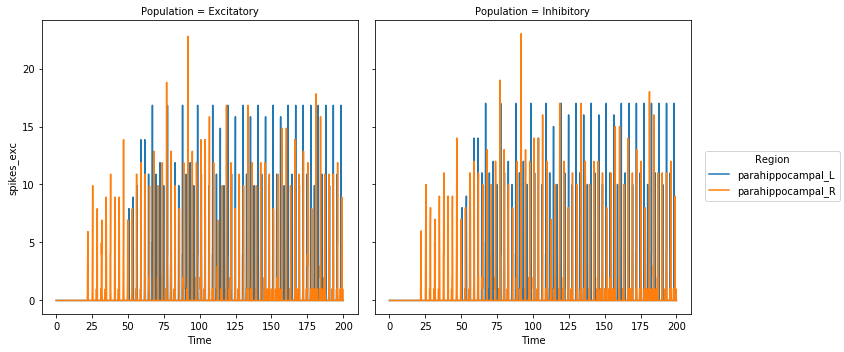

2020-01-13 16:56:32,837 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,875 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,901 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,948 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:32,989 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,025 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,065 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,091 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,178 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,219 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,286 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,315 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,382 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,408 -

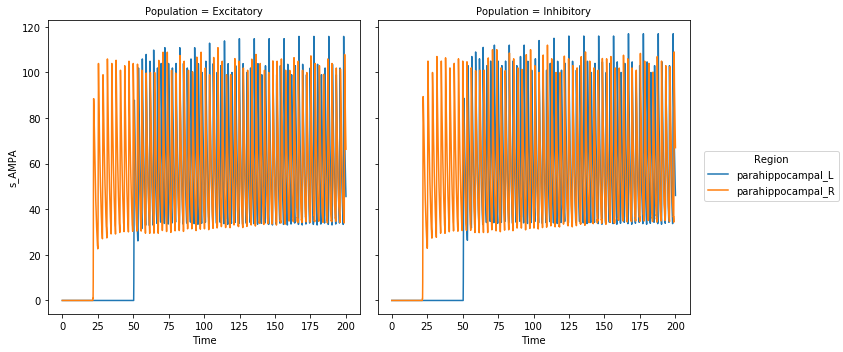

2020-01-13 16:56:33,680 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,712 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,738 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,768 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,797 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,826 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,862 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:33,898 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,017 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,061 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,126 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,162 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,247 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,275 -

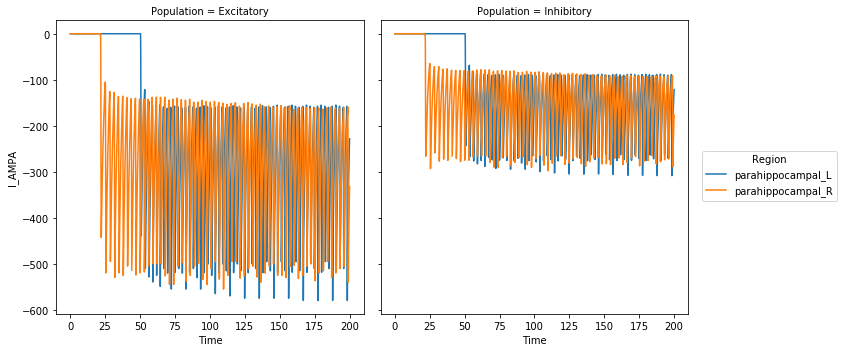

2020-01-13 16:56:34,591 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,637 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,718 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,761 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,813 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,857 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,940 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:34,982 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,085 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,127 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,199 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,232 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,322 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,353 -

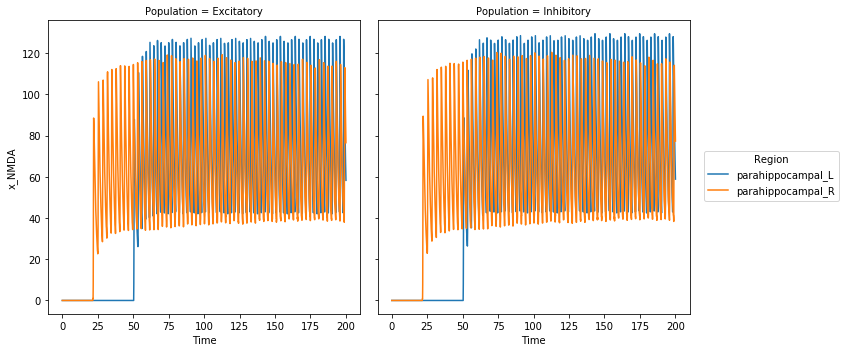

2020-01-13 16:56:35,799 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,847 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,879 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,914 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,954 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:35,989 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,054 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,082 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,146 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,177 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,231 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,256 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,311 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,333 -

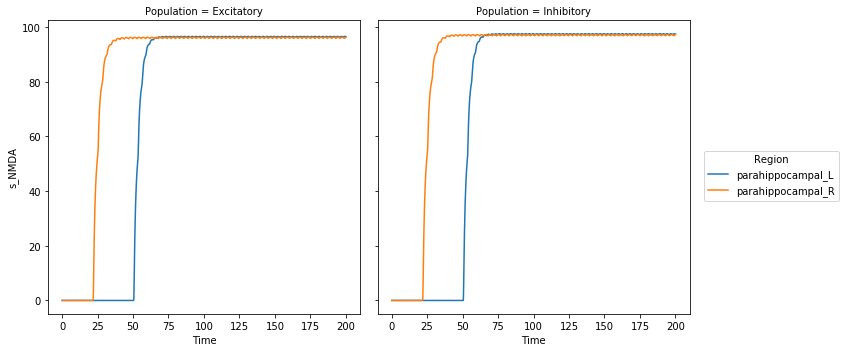

2020-01-13 16:56:36,564 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,599 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,626 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,657 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,688 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,722 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,764 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,790 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,841 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,865 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,908 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,930 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,973 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:36,996 -

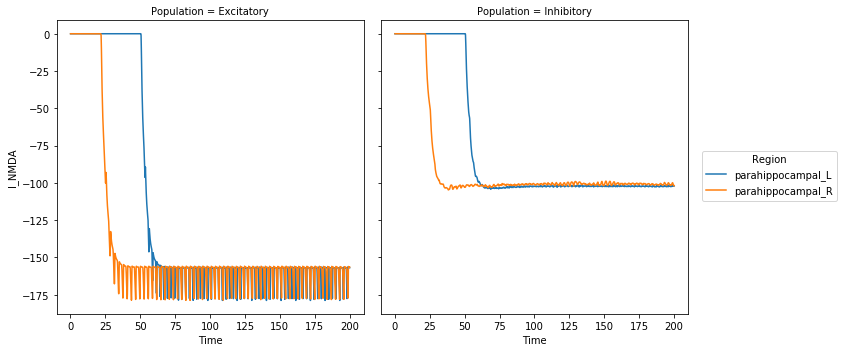

2020-01-13 16:56:37,261 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,295 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,318 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,346 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,377 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,405 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,445 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,466 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,522 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,546 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,584 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,604 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,648 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,670 -

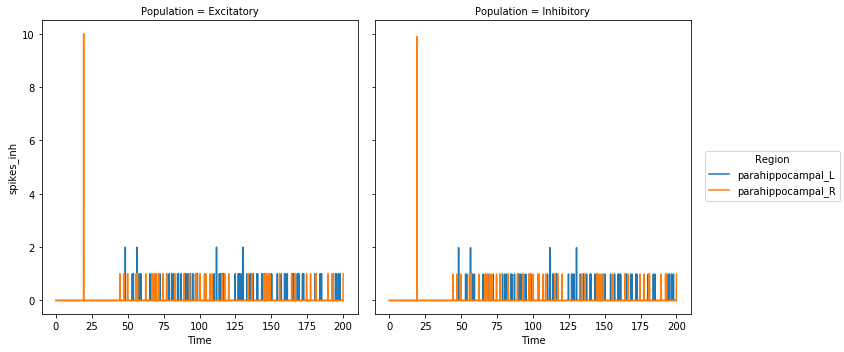

2020-01-13 16:56:37,926 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,958 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:37,982 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,010 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,064 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,123 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,184 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,214 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,288 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,321 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,375 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,402 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,467 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,498 -

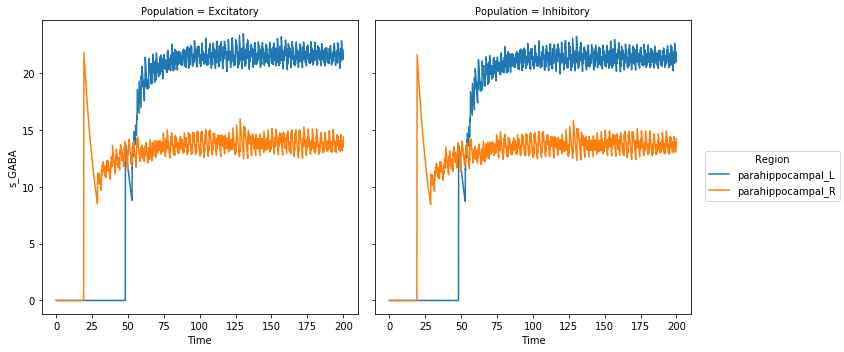

2020-01-13 16:56:38,825 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,879 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,915 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:38,960 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,006 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,052 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,112 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,139 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,227 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,263 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,313 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,340 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,402 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,434 -

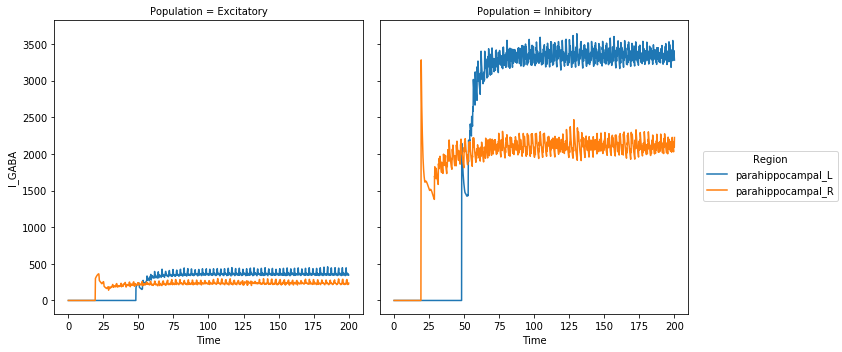

2020-01-13 16:56:39,723 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,772 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,839 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,877 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,923 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,967 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:39,997 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,066 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,097 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,155 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,187 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,246 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,276 -

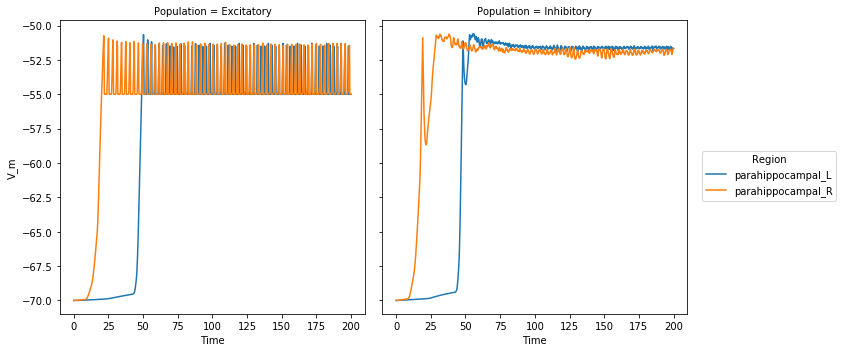

2020-01-13 16:56:40,569 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,615 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,642 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,676 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,713 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,744 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,783 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,806 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,860 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,884 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,924 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,946 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:40,997 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,025 -

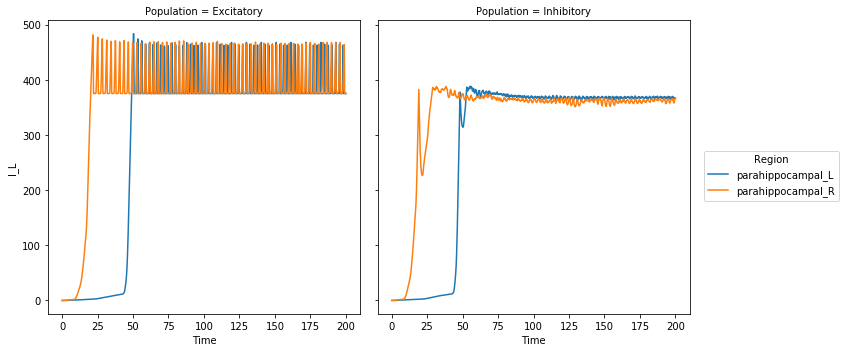

2020-01-13 16:56:41,267 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,301 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,323 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,350 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,378 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,403 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,445 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,466 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,513 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,534 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,569 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,588 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,641 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:41,677 -

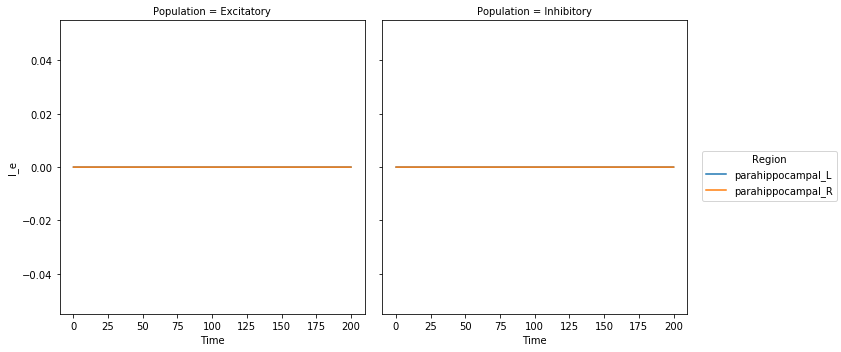

In [26]:
# ts.plot(plotter=plotter, )
for this_ts in [ts_ext, ts_exc, ts_inh, ts_neuron]:
    for var in this_ts.labels_dimensions[this_ts.labels_ordering[1]]:
        temp = this_ts[:, var]
        temp._data.name = "Mean %s data from NEST multimeter" % var
        temp.title = temp._data.name
        temp.plot_timeseries(plotter=plotter, figsize=(10, 5))
# ts_ext.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_exc.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_inh.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_neuron.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))

In [27]:
# ts_ext.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_exc.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_inh.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_neuron.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))

### Plotting NEST network spiking activity using xarray

2020-01-13 16:56:44,243 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:44,287 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:44,332 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:44,378 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:44,423 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f59bc913a58>
2020-01-13 16:56:44,424 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-01-13 16:56:44,427 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f59bc913a58>
2020-01-13 16:56:44,430 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-01-13 16:56:44,450 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:45,647 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:47,042 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-13 16:56:48,416 - DEBUG - matp

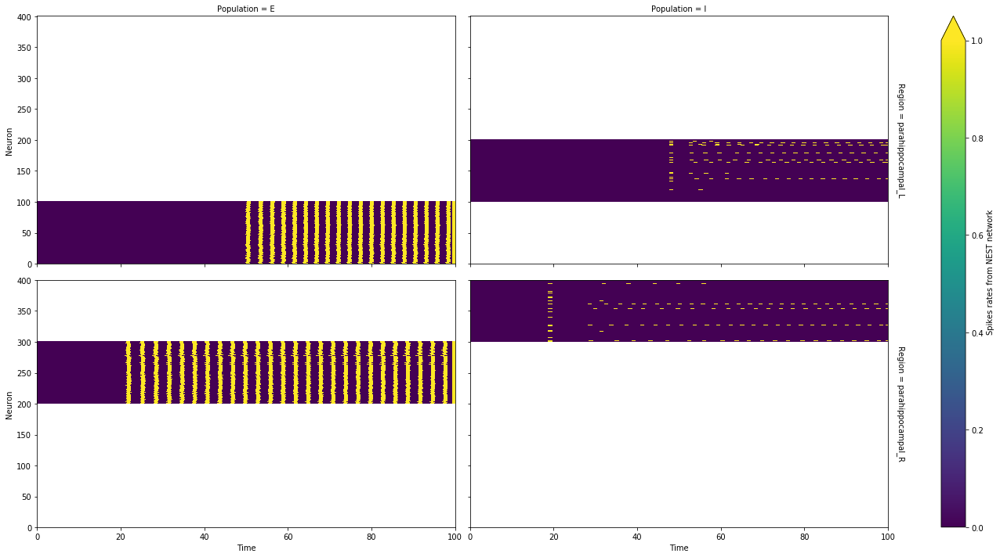

In [28]:
rates = nest_network.compute_spikes_rates(
            mode="per_neuron", population_devices=None, regions=None,
            devices_dim_name="Population", name="Spikes rates from NEST network",
            spikes_kernel_width=1.0, # spikes_kernel_n_intervals=10,
            spikes_kernel_overlap=0.5, min_spike_interval=None, time=np.arange(0, 100.0, 0.01),
            spikes_kernel=None)[0]

rates.plot(x=rates.dims[0], y=rates.dims[3], row=rates.dims[2], col=rates.dims[1], robust=True, figsize=(20, 10))
plotter.base._save_figure(figure_name="Spike rates per neuron")

# Next steps


### 1. Confirm spiking neuron model by reproducing qualitatively the mean field dynamics (e.g., bifurcations) the theory predicts

???Which interfaces should I test???


### 2. Fine tune the TVB -> NEST coupling by reproducing qualitatively the mean field dynamics under TVB input first for one-region NEST spiking network, and then for 2-region or 3-region interacting ones



### 3. Parameter investigation of TVB -> NEST coupling for robustness around the point of fine tuning

Possible parameters to vary:

1. Order (i.e., number) of spiking neurons per population (to also investigate computational efficiency...)

2. Total strength/scaling of TVB large scale coupling, G

3. Feedback inhibition parameter J_i


??? How to scale parameters with the order of spiking neurons per population, so that the input a single neuron receives remains the same ???

For instance...

I could keep the total number of connections per neuron the same by applying a sparse neuronal connectivity...

or...

I could downscale the connections' weights...

# Future work

Use co-simulation in memory consolidation networks

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>
   
3 Deco Gustavo, Ponce Alvarez Adrian, Dante Mantini, Gian Luca Romani, <br>
  Patric Hagmann and Maurizio Corbetta. <br>
  Resting-State Functional Connectivity Emerges from Structurally and <br>
  Dynamically Shaped Slow Linear Fluctuations. <br>
  The Journal of Neuroscience 32(27), 11239-11252, 2013.<br>

4 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>